# Introduction

This notebook contains the used code to perform a hyperparameter search that can give some interesting insights into the learning rates. It has three parts, the investigation on the learning rate alpha while reconstruction, the same while training and also the evaluation of the learning rate lr_u in training. 

In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

from dataset import *
from train_abs import *
from test_abs import *
import skimage
import numpy

%load_ext autoreload
%autoreload 2

cuda
Loaded util functions


In [2]:
# import data
x_train_mnist, x_test_mnist = load_MNIST(32)
x_train_emnist, x_test_emnist = load_EMNIST(32)
x_test_fmnist, x_test_fmnist = load_FMNIST(32)
x_train_cifar, x_test_cifar = load_CIFAR10(32, channel = -1)
x_train_svhn, x_test_svhn = load_SVHN(32, channel=-1)
x_train_celeb, x_test_celeb = load_CELEBA(200, channel = -1)

# load the references, if these are not available,
# please run 'Reconstruction Using Learned Reference.ipynb' first

u_mnist = np.load(f'./output_abs/20200202_mnist_5_1_32_1_1_50_[0, 1]/u_mnist_32.npy')
u_emnist = np.load(f'./output_abs/20200202_emnist_5_1_32_1_1_50_[0, 1]/u_emnist_32.npy')
u_fmnist = np.load(f'./output_abs/20200202_fmnist_5_1_32_1_1_50_[0, 1]/u_fmnist_32.npy')
u_cifar = np.load(f'./output_abs/20200202_cifar_5_1_32_1.3_1_50_[0, 1]/u_cifar_32.npy')
u_svhn = np.load(f'./output_abs/20200202_svhn_10_1_32_1.3_10_50_[0, 1]/u_svhn_32.npy') 
u_celeb = np.load(f'./output_abs/20200202_celeb_15_1_32_1_1_50_[0, 1]/u_celeb_32.npy')

Loaded MNIST dataset: x_train(100000, 32, 32), x_valid(140000, 32, 32)
Loaded EMNIST dataset: x_train(100000, 32, 32), x_valid(24800, 32, 32)
Loaded FashionMNIST gray dataset: x_train(60000, 32, 32), x_valid(10000, 32, 32)
Files already downloaded and verified
Files already downloaded and verified
using Gray image
Loaded CIFAR10 gray dataset: x_train(50000, 32, 32), x_valid(10000, 32, 32)
Using downloaded and verified file: ./data/train_32x32.mat
Using downloaded and verified file: ./data/test_32x32.mat
using Gray image
Loaded SVHN gray dataset: x_train(73257, 32, 32), x_valid(26032, 32, 32)
using Gray image
Loaded CELEBA gray dataset: x_train(200, 200, 200), x_valid(1000, 200, 200)


In [3]:
# these are the default hyperparameters, we use only 5 epochs for computational reasons
n_steps = 50
n_epoch = 5
n_train = 32
n_batch = 32
lr_u = 1
U_range = [0,1]
n_test = 1000

# learing rates
lrs = [0.25, 0.5, 0.75, 1, 1.25, 1.5, 1.75, 2, 2.25, 2.5]

# 1. Variable learning rate alpha in reconstruction

## MNIST

------------------------------- lr: 0.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 80.85it/s]


mse 0.00
psnr 27.36
ssim 0.88
mean mse 0.00
psnr of mean 23.82
psnr of mean (mean of psnr) 23.82(27.36)


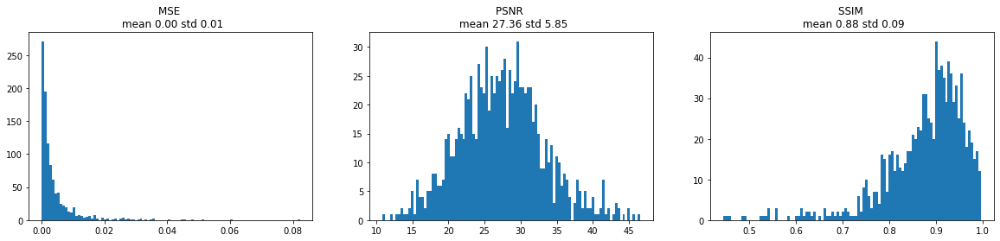

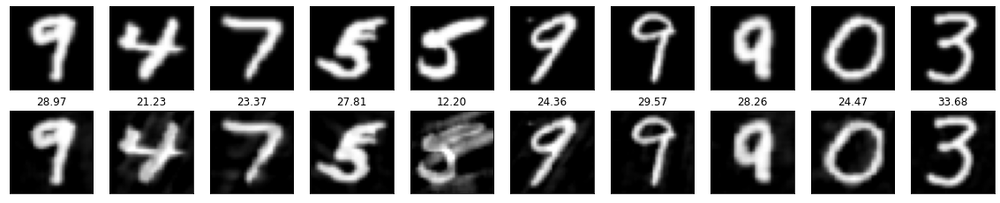

 28%|██▊       | 9/32 [00:00<00:00, 81.73it/s]

------------------------------- lr: 0.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.22it/s]


mse 0.00
psnr 39.02
ssim 0.97
mean mse 0.00
psnr of mean 28.96
psnr of mean (mean of psnr) 28.96(39.02)


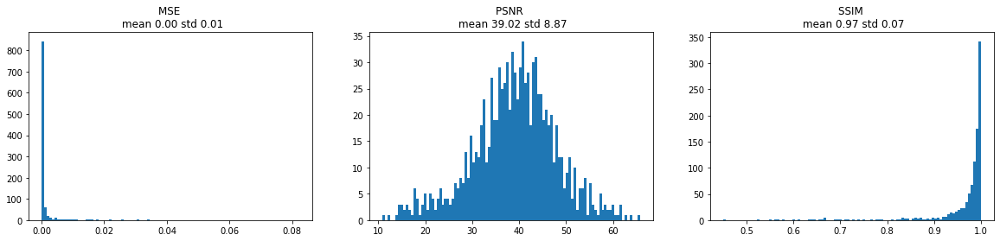

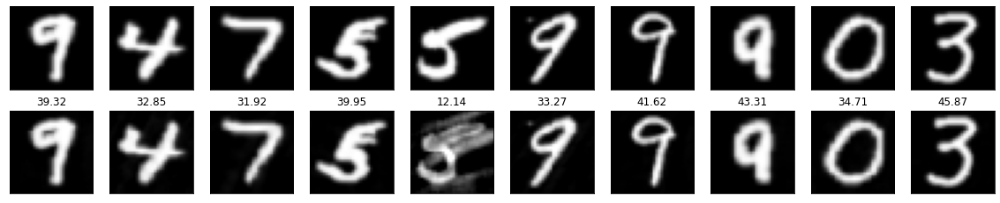

 28%|██▊       | 9/32 [00:00<00:00, 81.65it/s]

------------------------------- lr: 0.75--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.18it/s]


mse 0.00
psnr 49.68
ssim 0.99
mean mse 0.00
psnr of mean 32.13
psnr of mean (mean of psnr) 32.13(49.68)


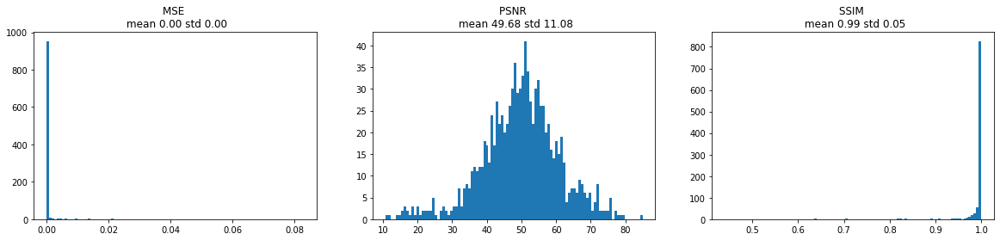

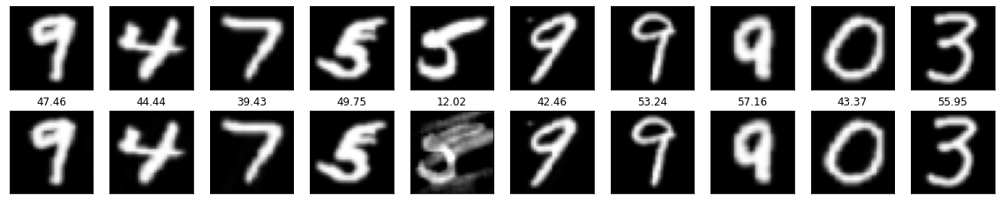

 28%|██▊       | 9/32 [00:00<00:00, 81.32it/s]

------------------------------- lr: 1--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.12it/s]


mse 0.00
psnr 59.59
ssim 0.99
mean mse 0.00
psnr of mean 34.01
psnr of mean (mean of psnr) 34.01(59.59)


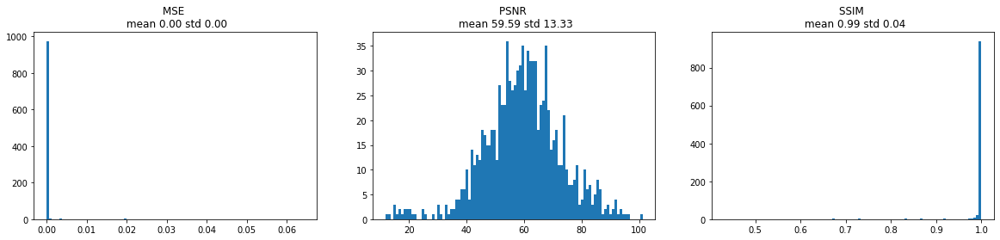

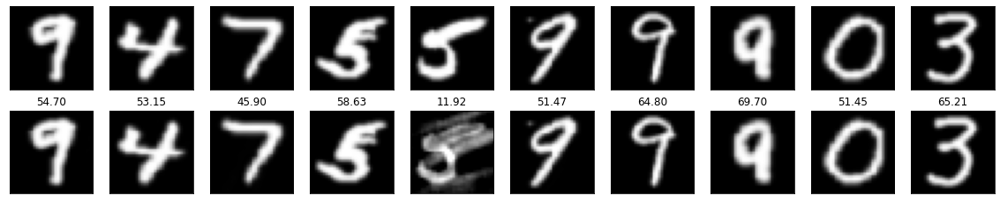

 28%|██▊       | 9/32 [00:00<00:00, 81.63it/s]

------------------------------- lr: 1.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.09it/s]


mse 0.00
psnr 69.20
ssim 1.00
mean mse 0.00
psnr of mean 34.86
psnr of mean (mean of psnr) 34.86(69.20)


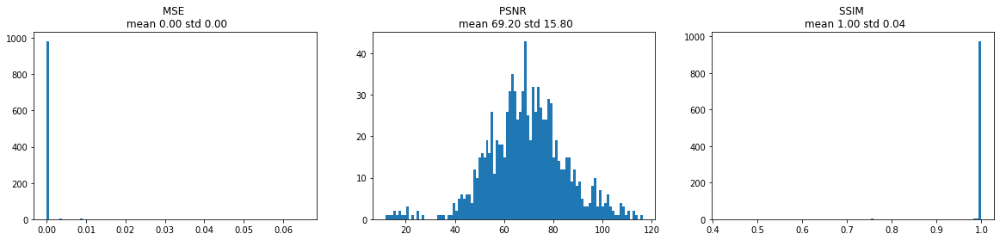

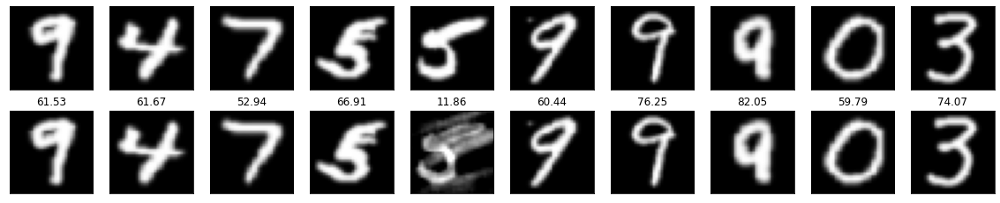

 28%|██▊       | 9/32 [00:00<00:00, 81.43it/s]

------------------------------- lr: 1.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 80.98it/s]


mse 0.00
psnr 78.81
ssim 1.00
mean mse 0.00
psnr of mean 36.48
psnr of mean (mean of psnr) 36.48(78.81)


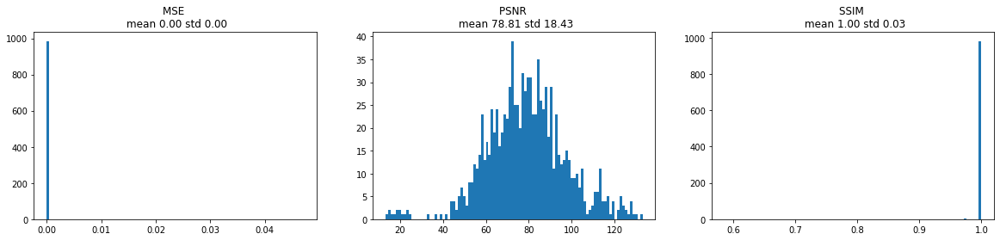

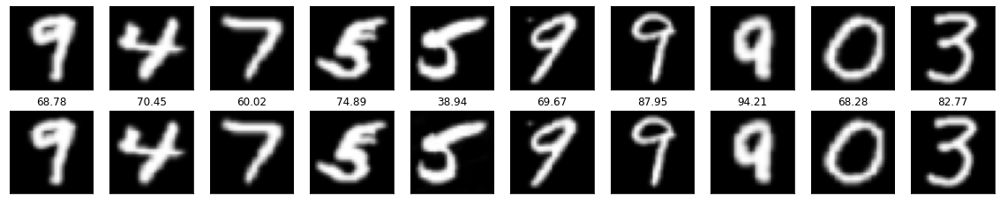

 28%|██▊       | 9/32 [00:00<00:00, 81.63it/s]

------------------------------- lr: 1.75--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.12it/s]


mse 0.00
psnr 88.94
ssim 1.00
mean mse 0.00
psnr of mean 38.20
psnr of mean (mean of psnr) 38.20(88.94)


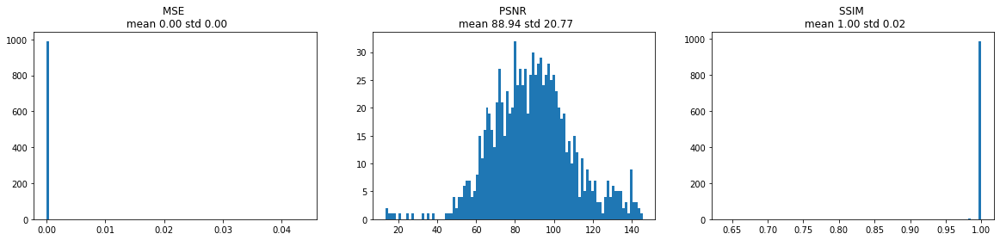

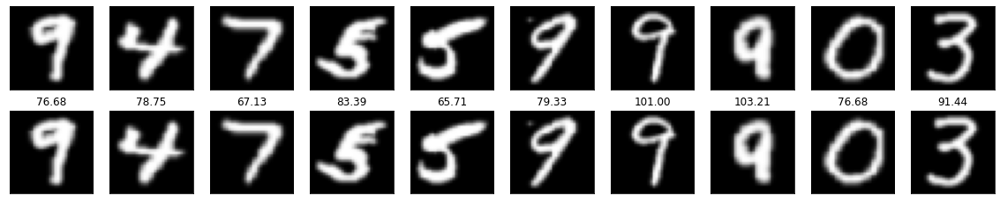

 28%|██▊       | 9/32 [00:00<00:00, 81.65it/s]

------------------------------- lr: 2--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.21it/s]


mse 0.00
psnr 77.57
ssim 1.00
mean mse 0.00
psnr of mean 37.53
psnr of mean (mean of psnr) 37.53(77.57)


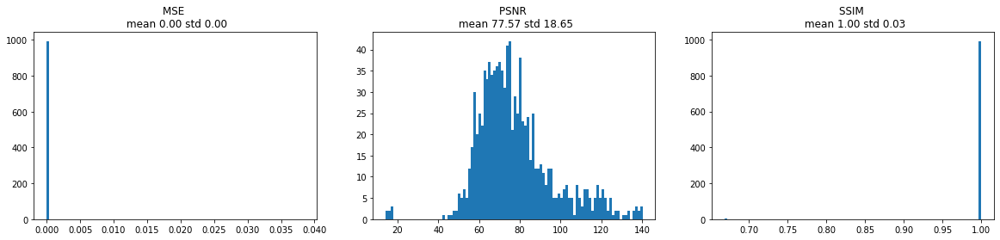

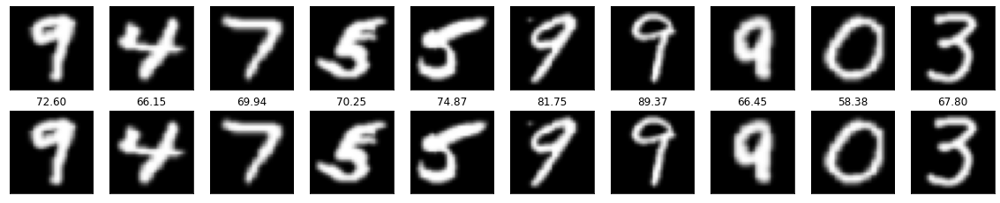

 28%|██▊       | 9/32 [00:00<00:00, 81.42it/s]

------------------------------- lr: 2.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.05it/s]


mse 0.00
psnr 27.79
ssim 0.94
mean mse 0.00
psnr of mean 23.20
psnr of mean (mean of psnr) 23.20(27.79)


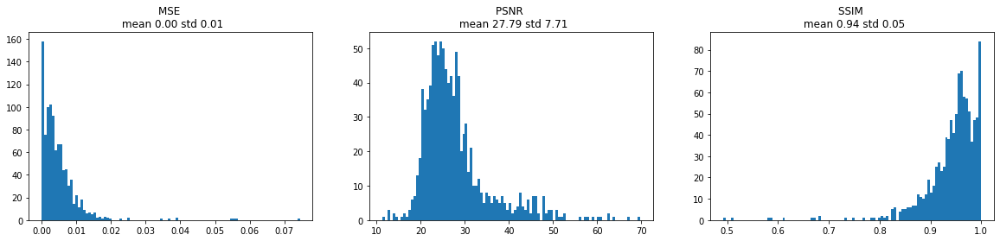

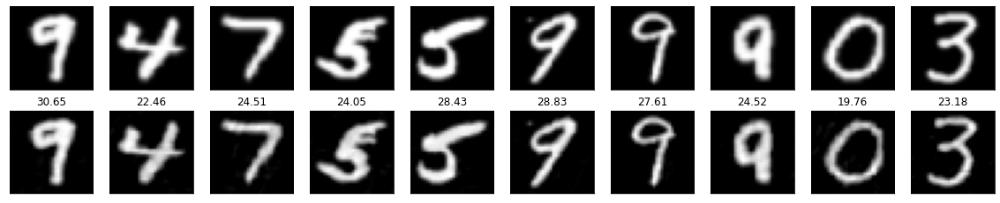

 28%|██▊       | 9/32 [00:00<00:00, 81.52it/s]

------------------------------- lr: 2.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.00it/s]


mse 0.05
psnr 14.97
ssim 0.59
mean mse 0.05
psnr of mean 13.40
psnr of mean (mean of psnr) 13.40(14.97)


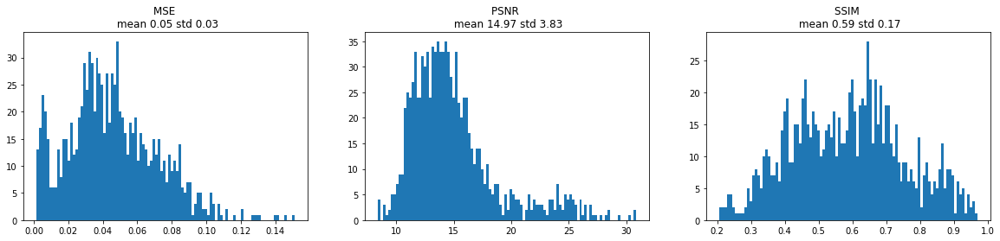

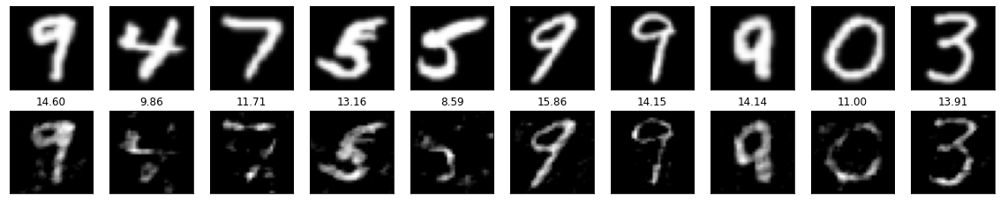

In [4]:
for lr in lrs:
    print(f'------------------------------- lr: {lr}--------------------------------------------')
    x_test_rec_mnist, mse_list_mnist, psnr_list_mnist, ssim_list_mnist = test_abs(n_test,
                                                                              n_batch,
                                                                              n_steps,
                                                                              lr,
                                                                              u_mnist,
                                                                              x_test_mnist)

    plot_test(x_test_rec_mnist,
          x_test_mnist,
          mse_list_mnist,
          psnr_list_mnist,
          ssim_list_mnist,
          n_test,
          plot_n = 10)

## EMNIST

 28%|██▊       | 9/32 [00:00<00:00, 81.51it/s]

------------------------------- lr: 0.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.07it/s]


mse 0.01
psnr 24.68
ssim 0.83
mean mse 0.01
psnr of mean 20.44
psnr of mean (mean of psnr) 20.44(24.68)


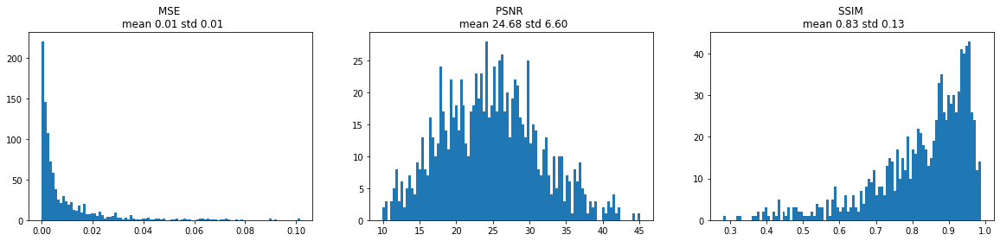

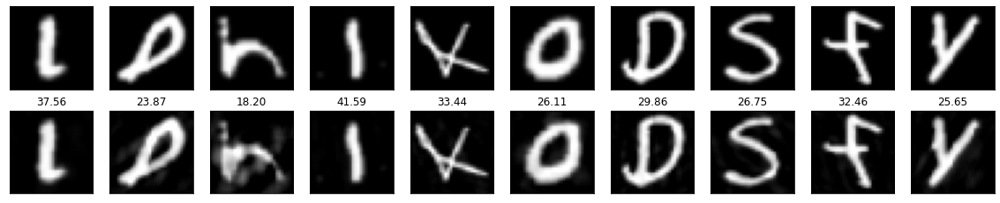

 28%|██▊       | 9/32 [00:00<00:00, 81.61it/s]

------------------------------- lr: 0.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.16it/s]


mse 0.00
psnr 34.65
ssim 0.92
mean mse 0.00
psnr of mean 23.19
psnr of mean (mean of psnr) 23.19(34.65)


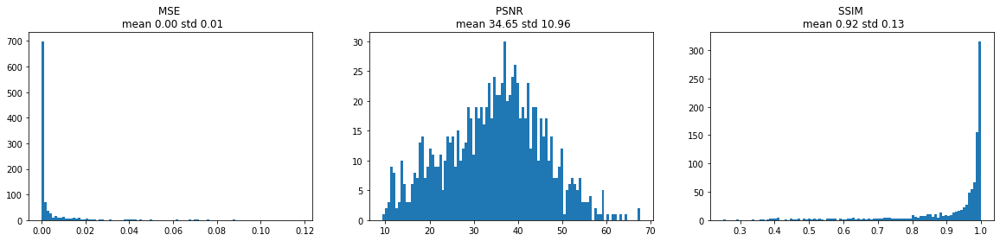

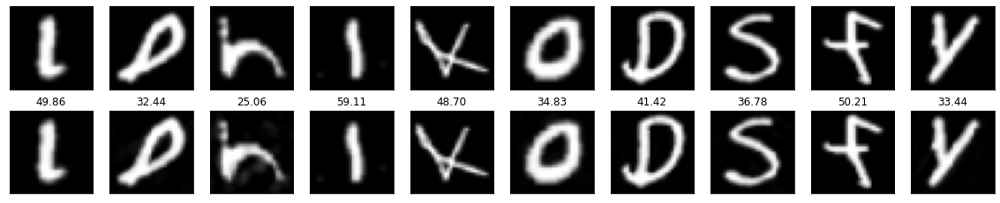

 28%|██▊       | 9/32 [00:00<00:00, 81.86it/s]

------------------------------- lr: 0.75--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.29it/s]


mse 0.00
psnr 44.17
ssim 0.95
mean mse 0.00
psnr of mean 24.63
psnr of mean (mean of psnr) 24.63(44.17)


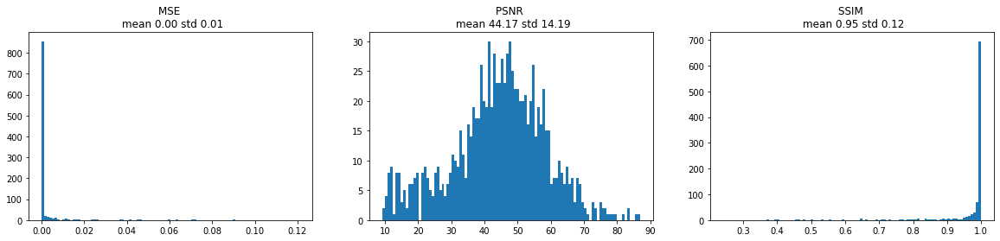

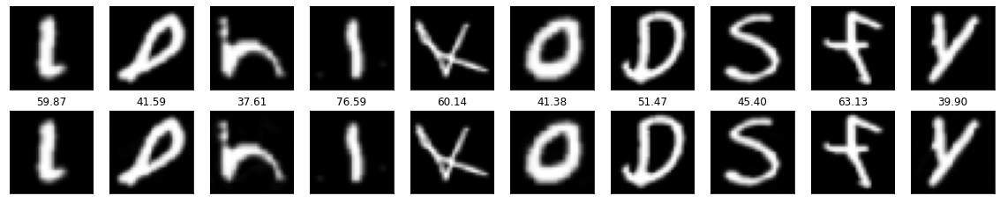

 28%|██▊       | 9/32 [00:00<00:00, 81.66it/s]

------------------------------- lr: 1--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.15it/s]


mse 0.00
psnr 53.17
ssim 0.97
mean mse 0.00
psnr of mean 25.18
psnr of mean (mean of psnr) 25.18(53.17)


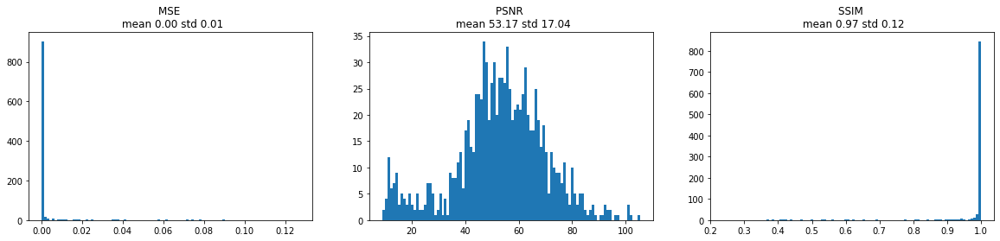

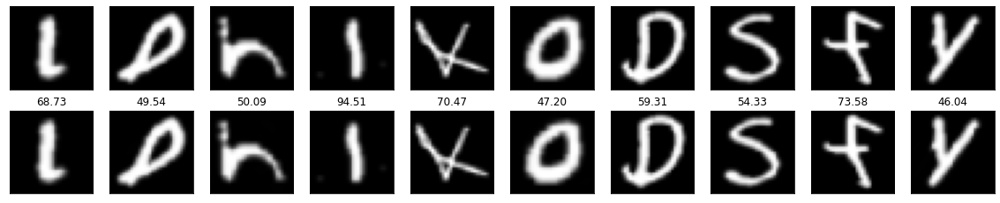

 28%|██▊       | 9/32 [00:00<00:00, 81.53it/s]

------------------------------- lr: 1.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 80.85it/s]


mse 0.00
psnr 61.92
ssim 0.97
mean mse 0.00
psnr of mean 25.53
psnr of mean (mean of psnr) 25.53(61.92)


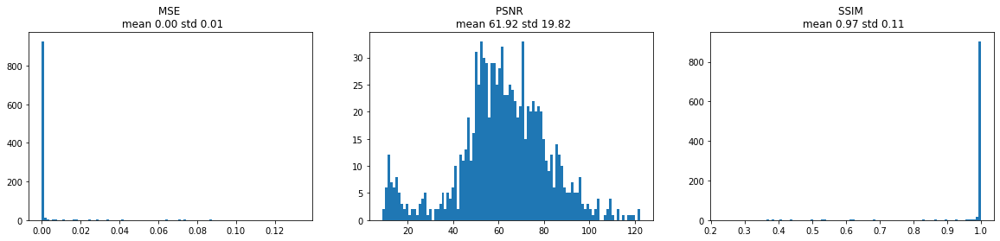

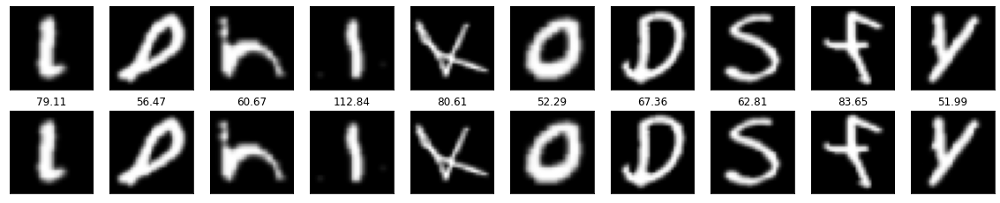

 28%|██▊       | 9/32 [00:00<00:00, 81.93it/s]

------------------------------- lr: 1.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.25it/s]


mse 0.00
psnr 70.53
ssim 0.98
mean mse 0.00
psnr of mean 25.88
psnr of mean (mean of psnr) 25.88(70.53)


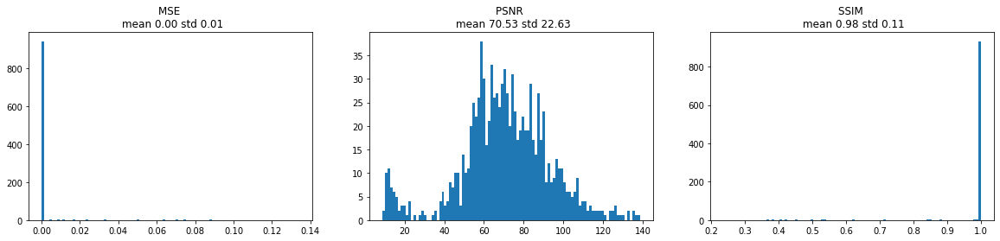

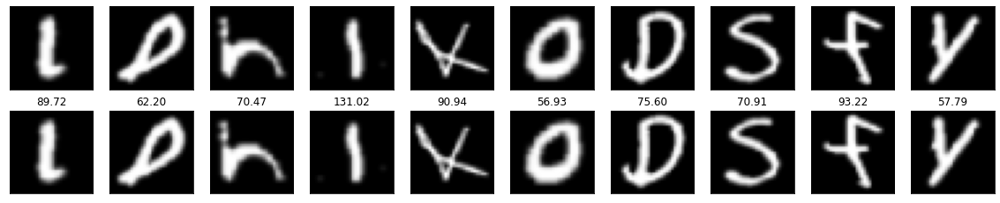

 28%|██▊       | 9/32 [00:00<00:00, 81.82it/s]

------------------------------- lr: 1.75--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.27it/s]


mse 0.00
psnr 79.54
ssim 0.98
mean mse 0.00
psnr of mean 26.13
psnr of mean (mean of psnr) 26.13(79.54)


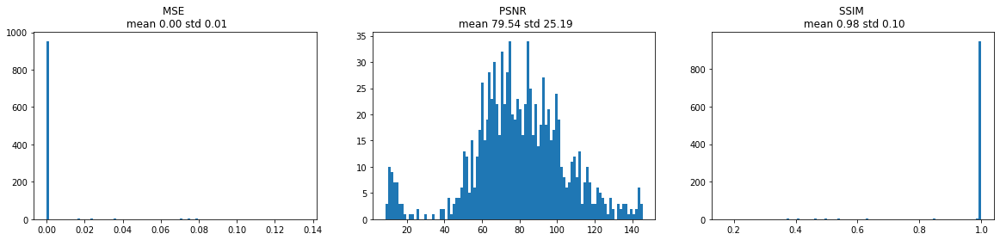

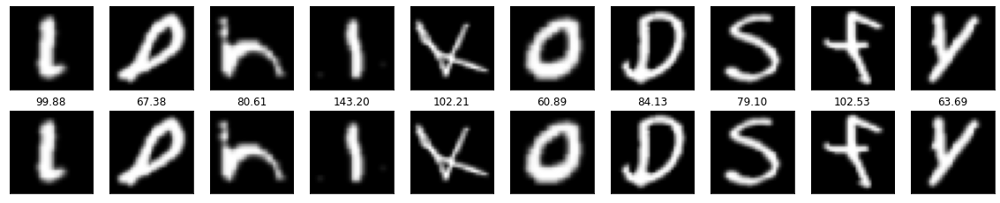

 28%|██▊       | 9/32 [00:00<00:00, 81.70it/s]

------------------------------- lr: 2--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.17it/s]


mse 0.00
psnr 70.30
ssim 0.98
mean mse 0.00
psnr of mean 26.25
psnr of mean (mean of psnr) 26.25(70.30)


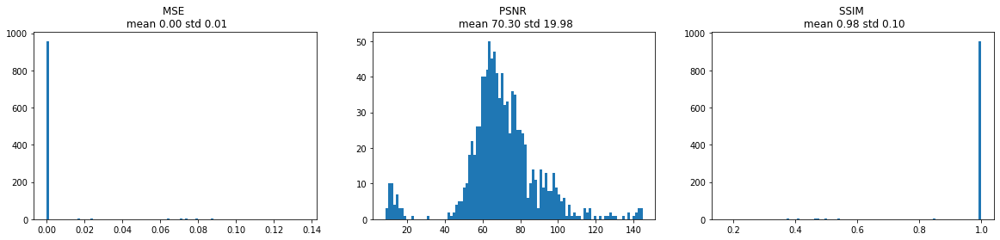

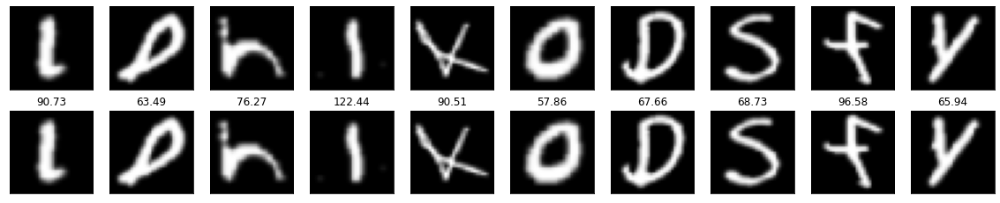

 28%|██▊       | 9/32 [00:00<00:00, 81.65it/s]

------------------------------- lr: 2.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.15it/s]


mse 0.01
psnr 26.05
ssim 0.92
mean mse 0.01
psnr of mean 21.12
psnr of mean (mean of psnr) 21.12(26.05)


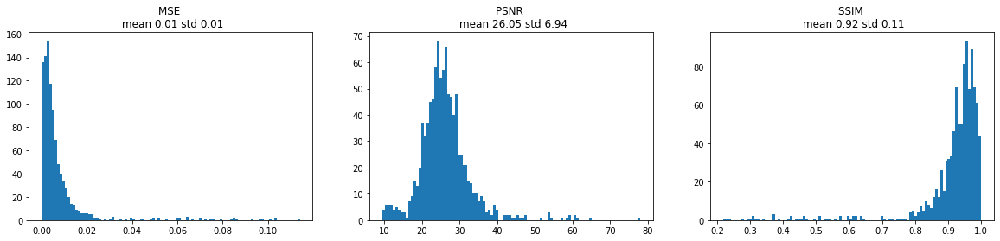

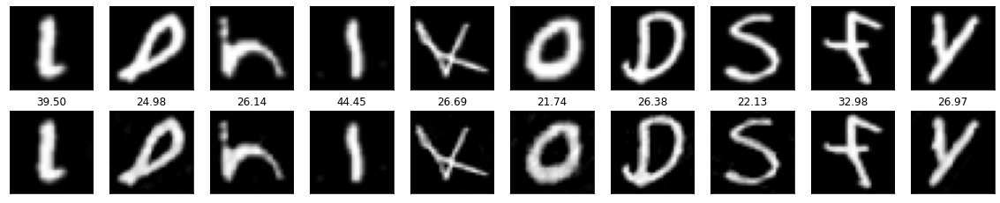

 28%|██▊       | 9/32 [00:00<00:00, 81.69it/s]

------------------------------- lr: 2.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 80.71it/s]


mse 0.05
psnr 14.55
ssim 0.56
mean mse 0.05
psnr of mean 13.17
psnr of mean (mean of psnr) 13.17(14.55)


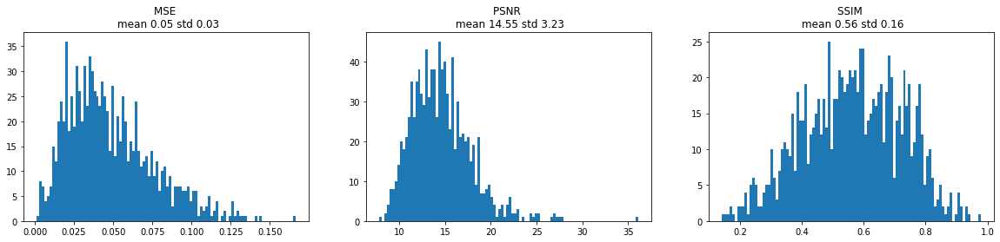

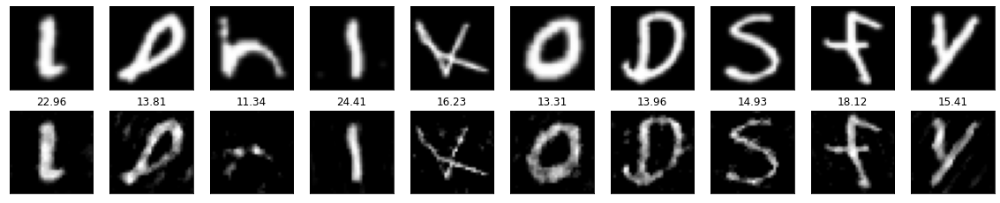

In [5]:
for lr in lrs:
    print(f'------------------------------- lr: {lr}--------------------------------------------')
    x_test_rec_emnist, mse_list_emnist, psnr_list_emnist, ssim_list_emnist = test_abs(n_test,
                                                                              n_batch,
                                                                              n_steps,
                                                                              lr,
                                                                              u_emnist,
                                                                              x_test_emnist)

    plot_test(x_test_rec_emnist,
          x_test_emnist,
          mse_list_emnist,
          psnr_list_emnist,
          ssim_list_emnist,
          n_test,
          plot_n = 10)

## FMNIST

 28%|██▊       | 9/32 [00:00<00:00, 81.69it/s]

------------------------------- lr: 0.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.20it/s]


mse 0.00
psnr 26.23
ssim 0.87
mean mse 0.00
psnr of mean 24.07
psnr of mean (mean of psnr) 24.07(26.23)


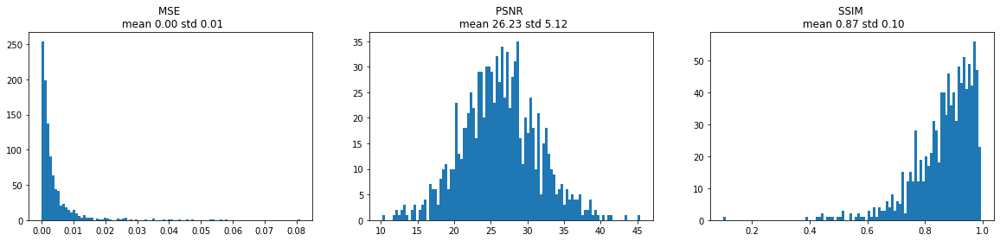

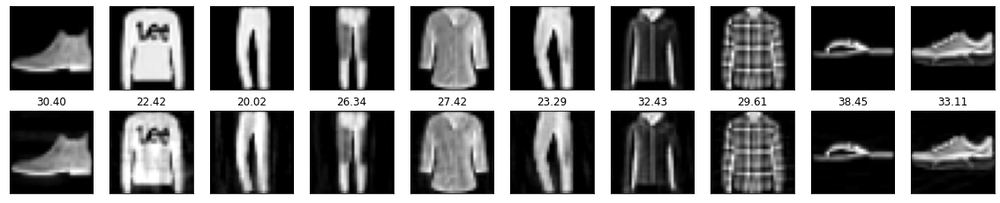

 28%|██▊       | 9/32 [00:00<00:00, 81.65it/s]

------------------------------- lr: 0.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 80.85it/s]


mse 0.00
psnr 34.34
ssim 0.94
mean mse 0.00
psnr of mean 27.43
psnr of mean (mean of psnr) 27.43(34.34)


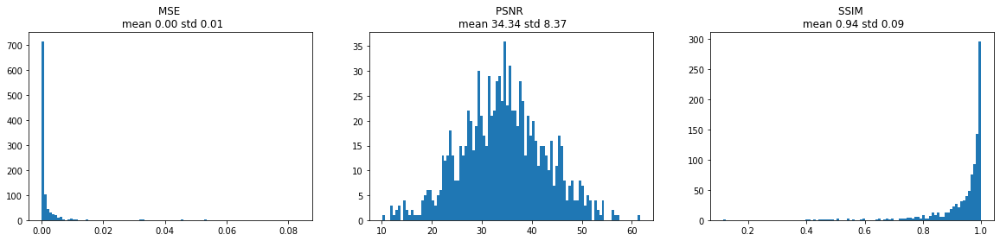

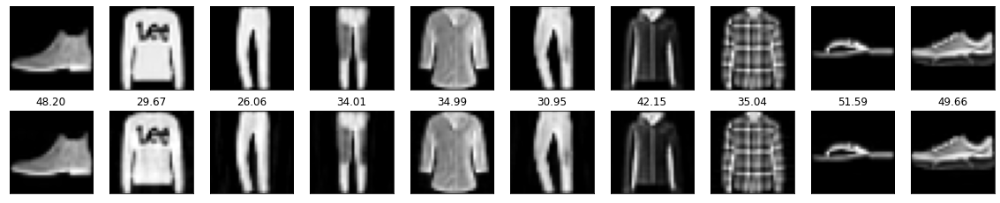

 28%|██▊       | 9/32 [00:00<00:00, 81.71it/s]

------------------------------- lr: 0.75--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.20it/s]


mse 0.00
psnr 41.72
ssim 0.97
mean mse 0.00
psnr of mean 28.73
psnr of mean (mean of psnr) 28.73(41.72)


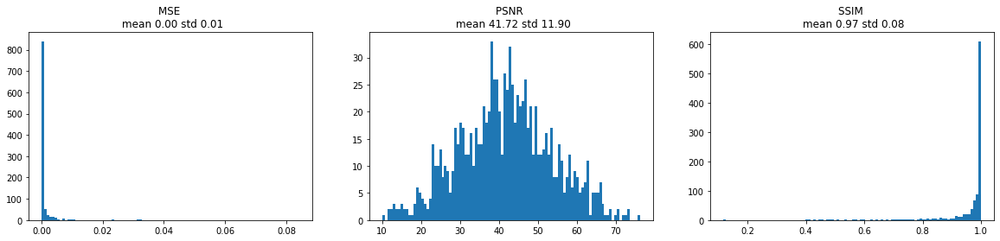

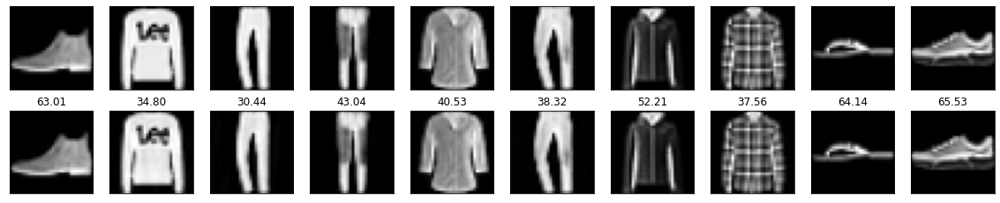

 28%|██▊       | 9/32 [00:00<00:00, 81.49it/s]

------------------------------- lr: 1--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 80.99it/s]


mse 0.00
psnr 48.65
ssim 0.97
mean mse 0.00
psnr of mean 29.39
psnr of mean (mean of psnr) 29.39(48.65)


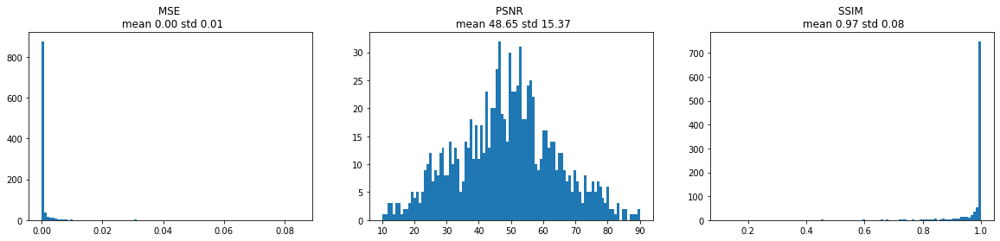

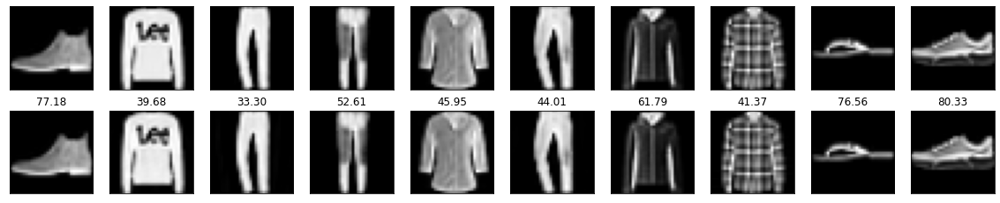

 28%|██▊       | 9/32 [00:00<00:00, 81.94it/s]

------------------------------- lr: 1.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.31it/s]


mse 0.00
psnr 55.40
ssim 0.98
mean mse 0.00
psnr of mean 29.86
psnr of mean (mean of psnr) 29.86(55.40)


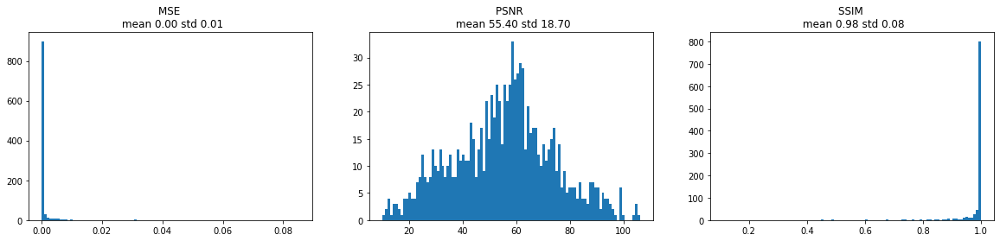

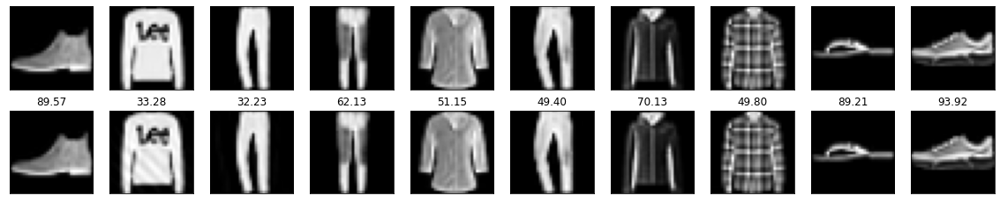

 28%|██▊       | 9/32 [00:00<00:00, 81.81it/s]

------------------------------- lr: 1.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.24it/s]


mse 0.00
psnr 62.26
ssim 0.98
mean mse 0.00
psnr of mean 30.04
psnr of mean (mean of psnr) 30.04(62.26)


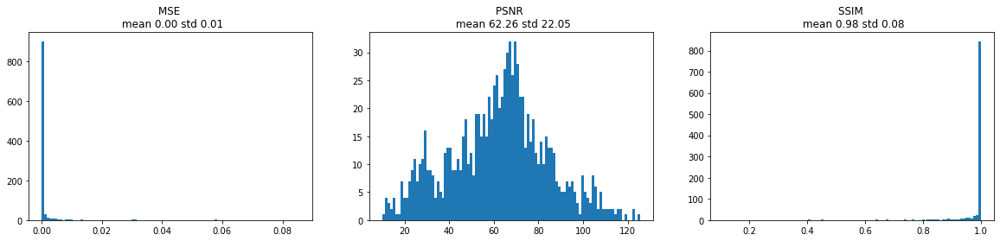

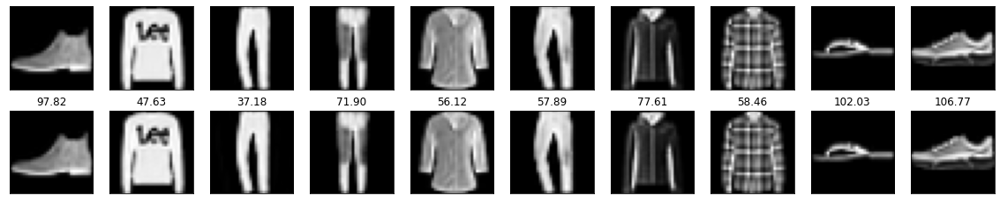

 28%|██▊       | 9/32 [00:00<00:00, 81.63it/s]

------------------------------- lr: 1.75--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.11it/s]


mse 0.00
psnr 69.58
ssim 0.98
mean mse 0.00
psnr of mean 30.13
psnr of mean (mean of psnr) 30.13(69.58)


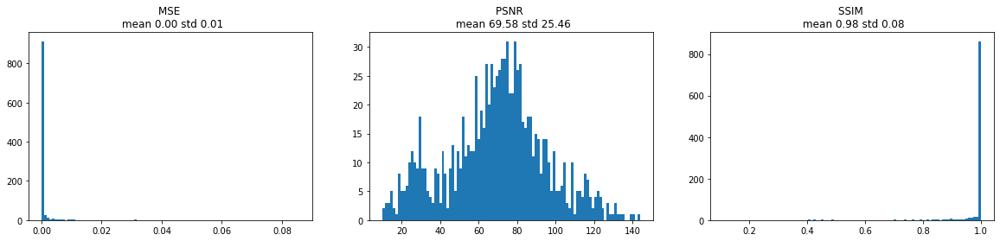

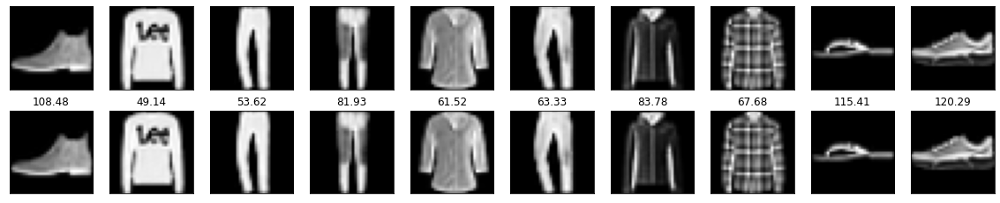

 28%|██▊       | 9/32 [00:00<00:00, 81.84it/s]

------------------------------- lr: 2--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.24it/s]


mse 0.00
psnr 52.24
ssim 0.98
mean mse 0.00
psnr of mean 29.14
psnr of mean (mean of psnr) 29.14(52.24)


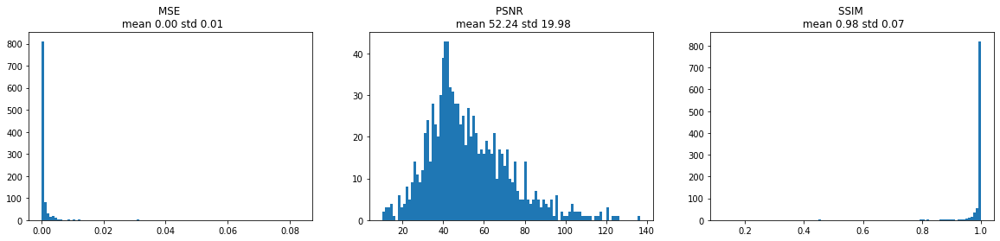

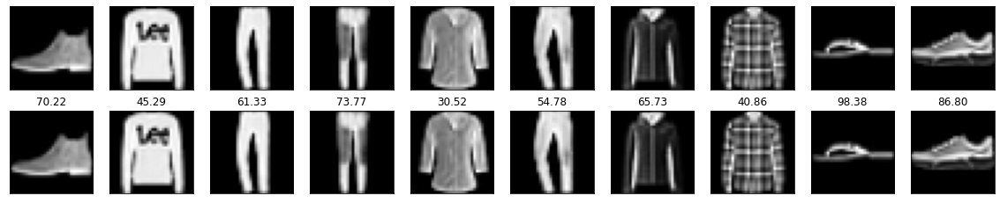

 28%|██▊       | 9/32 [00:00<00:00, 81.48it/s]

------------------------------- lr: 2.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.04it/s]


mse 0.04
psnr 16.97
ssim 0.63
mean mse 0.04
psnr of mean 13.47
psnr of mean (mean of psnr) 13.47(16.97)


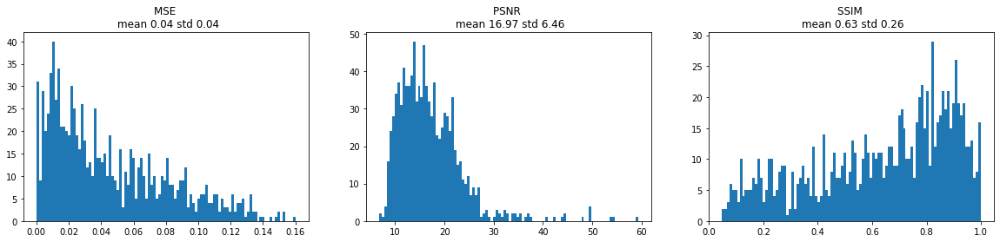

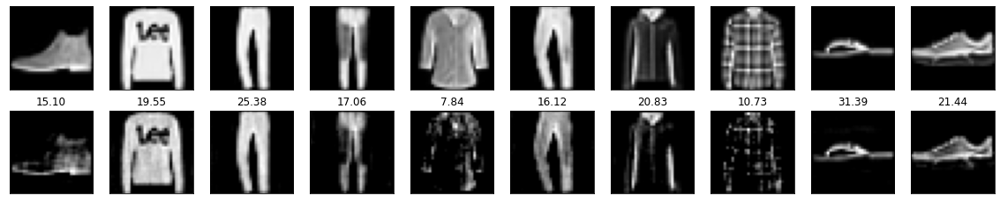

 28%|██▊       | 9/32 [00:00<00:00, 81.97it/s]

------------------------------- lr: 2.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.35it/s]


mse 0.09
psnr 10.83
ssim 0.37
mean mse 0.09
psnr of mean 10.29
psnr of mean (mean of psnr) 10.29(10.83)


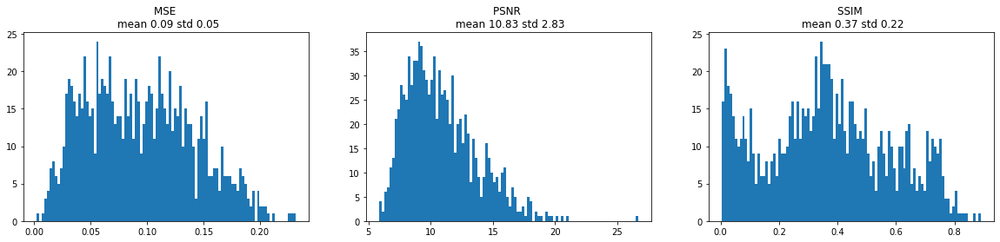

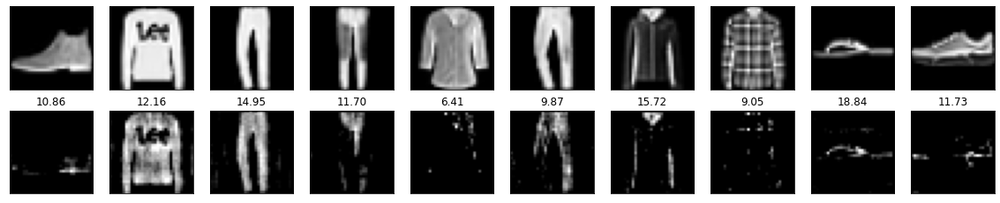

In [6]:
for lr in lrs:
    print(f'------------------------------- lr: {lr}--------------------------------------------')
    x_test_rec_fmnist, mse_list_fmnist, psnr_list_fmnist, ssim_list_fmnist = test_abs(n_test,
                                                                              n_batch,
                                                                              n_steps,
                                                                              lr,
                                                                              u_fmnist,
                                                                              x_test_fmnist)

    plot_test(x_test_rec_fmnist,
          x_test_fmnist,
          mse_list_fmnist,
          psnr_list_fmnist,
          ssim_list_fmnist,
          n_test,
          plot_n = 10)

## SVHN

 25%|██▌       | 8/32 [00:00<00:00, 78.82it/s]

------------------------------- lr: 0.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 80.49it/s]


mse 0.00
psnr 28.29
ssim 0.97
mean mse 0.00
psnr of mean 30.70
psnr of mean (mean of psnr) 30.70(28.29)


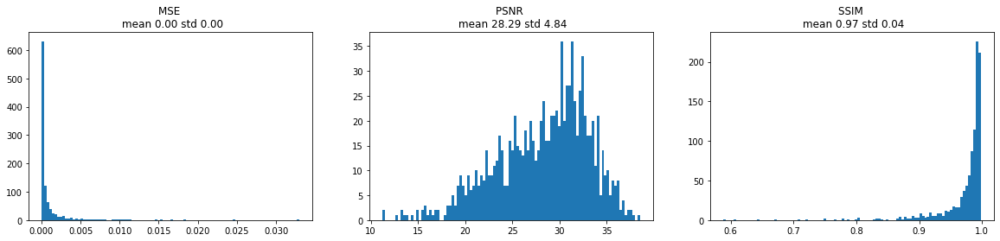

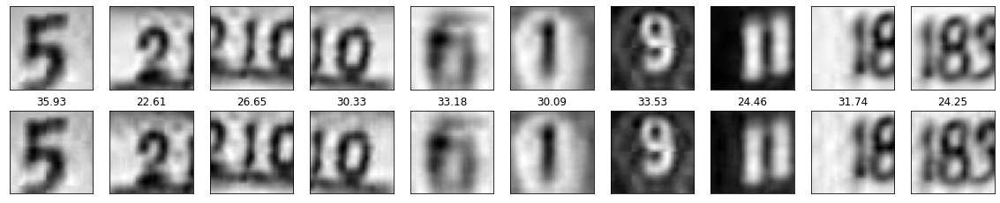

 28%|██▊       | 9/32 [00:00<00:00, 81.72it/s]

------------------------------- lr: 0.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.24it/s]


mse 0.00
psnr 36.33
ssim 0.99
mean mse 0.00
psnr of mean 33.70
psnr of mean (mean of psnr) 33.70(36.33)


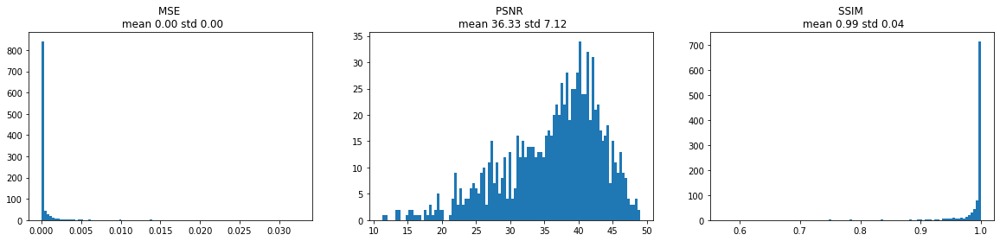

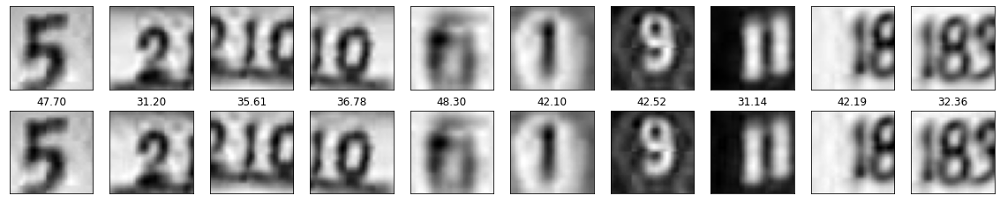

 28%|██▊       | 9/32 [00:00<00:00, 81.64it/s]

------------------------------- lr: 0.75--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.25it/s]


mse 0.00
psnr 42.31
ssim 0.99
mean mse 0.00
psnr of mean 34.74
psnr of mean (mean of psnr) 34.74(42.31)


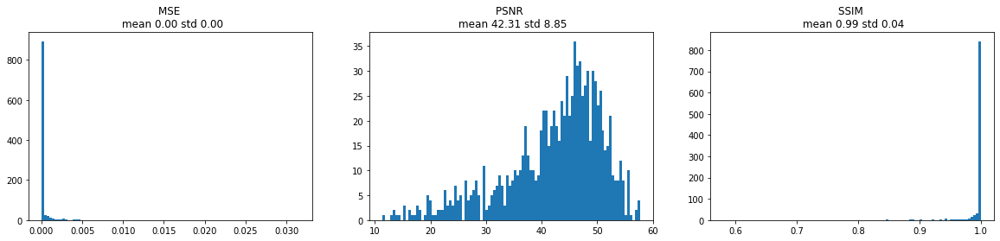

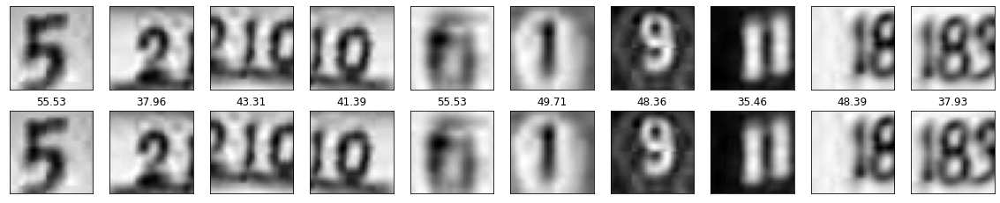

 28%|██▊       | 9/32 [00:00<00:00, 81.69it/s]

------------------------------- lr: 1--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.20it/s]


mse 0.00
psnr 47.27
ssim 0.99
mean mse 0.00
psnr of mean 35.31
psnr of mean (mean of psnr) 35.31(47.27)


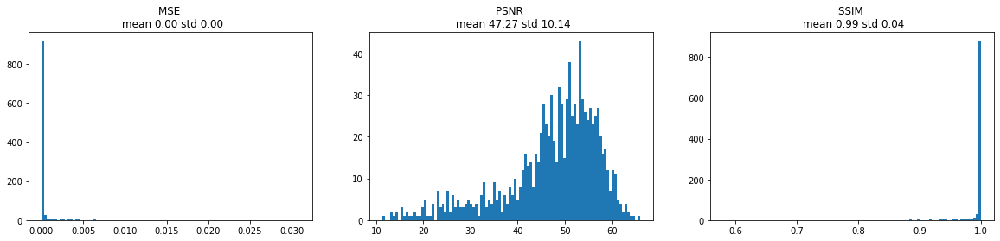

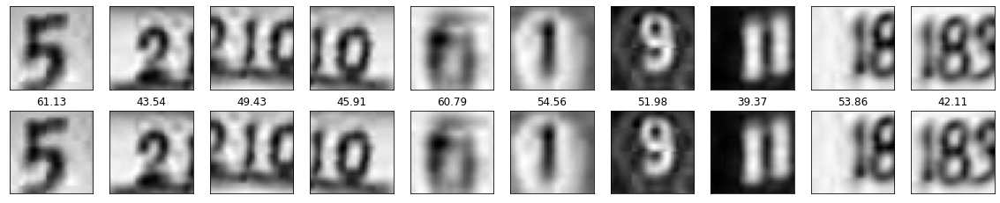

 28%|██▊       | 9/32 [00:00<00:00, 81.71it/s]

------------------------------- lr: 1.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 80.77it/s]


mse 0.00
psnr 51.60
ssim 0.99
mean mse 0.00
psnr of mean 35.73
psnr of mean (mean of psnr) 35.73(51.60)


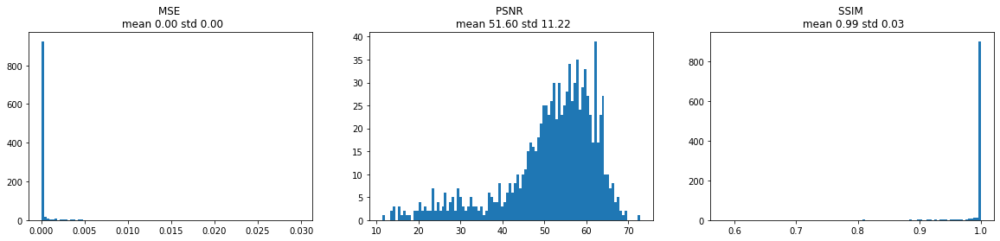

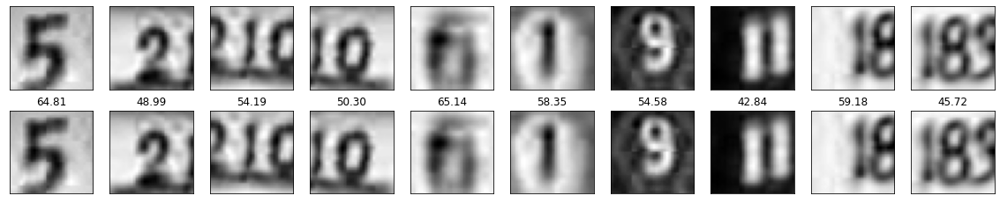

 28%|██▊       | 9/32 [00:00<00:00, 81.80it/s]

------------------------------- lr: 1.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 80.85it/s]


mse 0.00
psnr 55.12
ssim 0.99
mean mse 0.00
psnr of mean 35.95
psnr of mean (mean of psnr) 35.95(55.12)


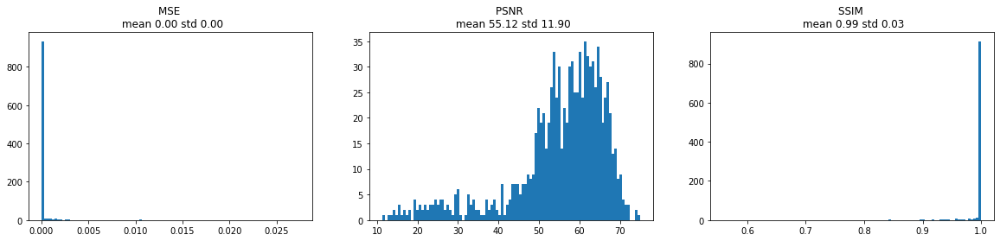

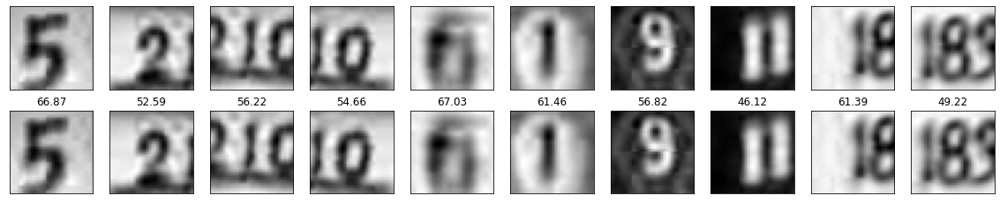

 28%|██▊       | 9/32 [00:00<00:00, 81.67it/s]

------------------------------- lr: 1.75--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.13it/s]


mse 0.00
psnr 57.82
ssim 0.99
mean mse 0.00
psnr of mean 36.27
psnr of mean (mean of psnr) 36.27(57.82)


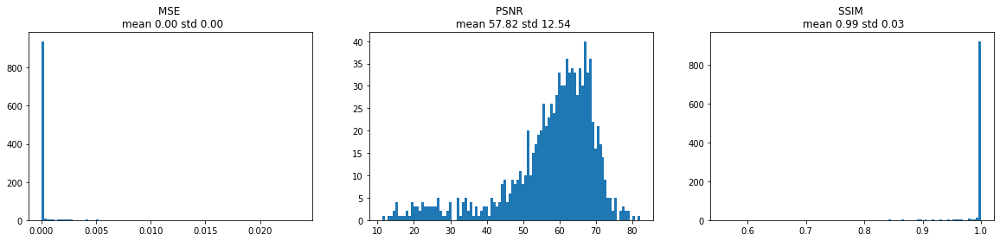

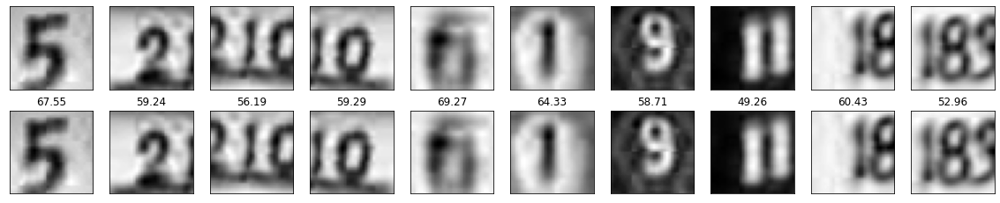

 28%|██▊       | 9/32 [00:00<00:00, 81.45it/s]

------------------------------- lr: 2--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.07it/s]


mse 0.03
psnr 18.54
ssim 0.71
mean mse 0.03
psnr of mean 14.96
psnr of mean (mean of psnr) 14.96(18.54)


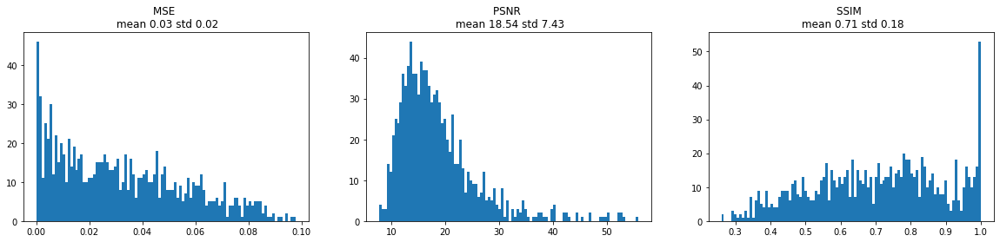

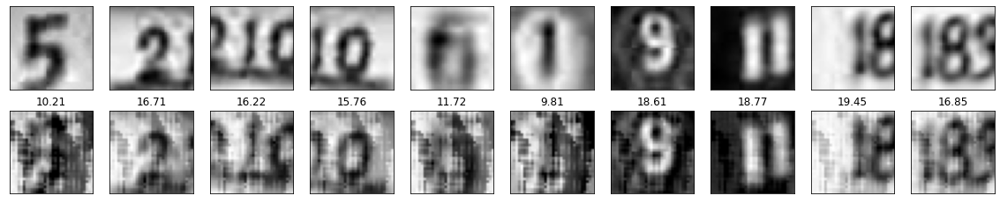

 28%|██▊       | 9/32 [00:00<00:00, 81.65it/s]

------------------------------- lr: 2.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.16it/s]


mse 0.13
psnr 9.40
ssim 0.26
mean mse 0.13
psnr of mean 9.01
psnr of mean (mean of psnr) 9.01(9.40)


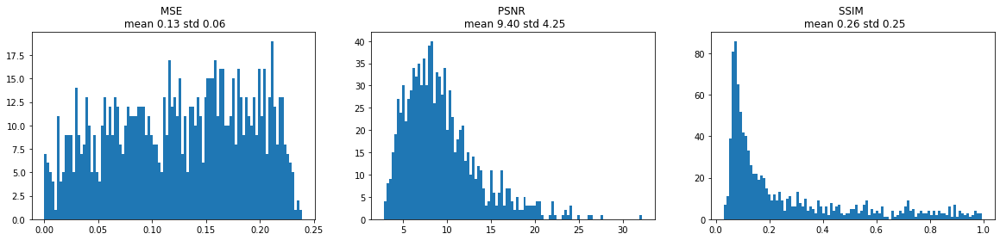

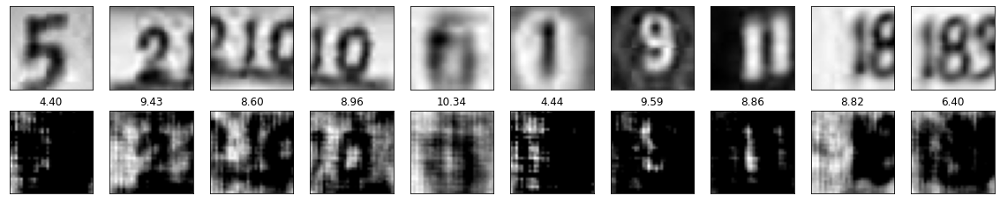

 28%|██▊       | 9/32 [00:00<00:00, 81.81it/s]

------------------------------- lr: 2.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.31it/s]


mse 0.16
psnr 7.53
ssim 0.15
mean mse 0.16
psnr of mean 7.87
psnr of mean (mean of psnr) 7.87(7.53)


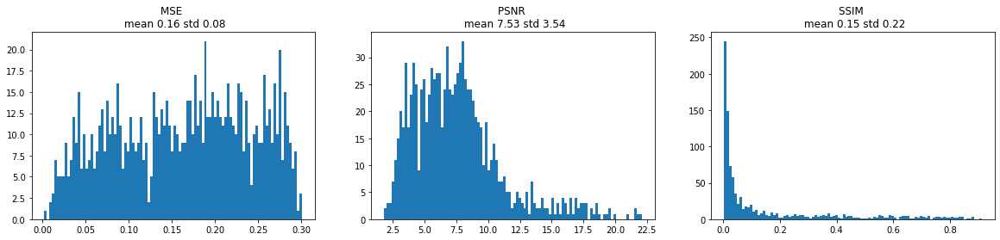

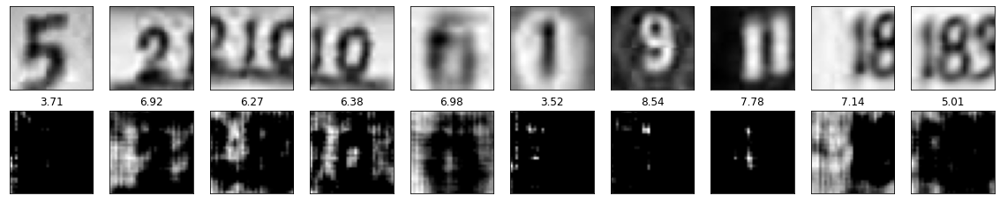

In [7]:
for lr in lrs:
    print(f'------------------------------- lr: {lr}--------------------------------------------')
    x_test_rec_svhn, mse_list_svhn, psnr_list_svhn, ssim_list_svhn = test_abs(n_test,
                                                                              n_batch,
                                                                              n_steps,
                                                                              lr,
                                                                              u_svhn,
                                                                              x_test_svhn)

    plot_test(x_test_rec_svhn,
          x_test_svhn,
          mse_list_svhn,
          psnr_list_svhn,
          ssim_list_svhn,
          n_test,
          plot_n = 10)

## CIFAR10

 28%|██▊       | 9/32 [00:00<00:00, 81.30it/s]

------------------------------- lr: 0.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 80.92it/s]


mse 0.00
psnr 26.09
ssim 0.93
mean mse 0.00
psnr of mean 24.68
psnr of mean (mean of psnr) 24.68(26.09)


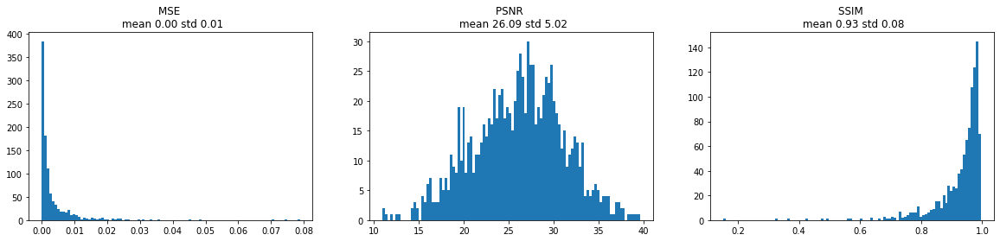

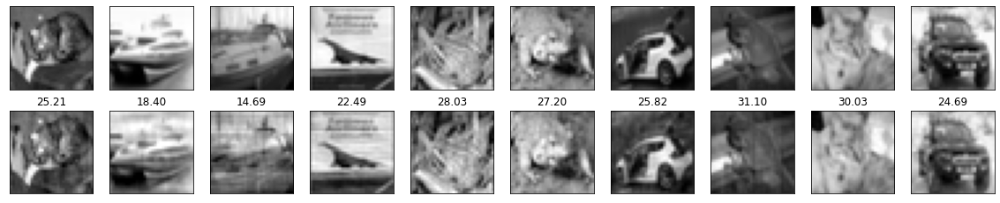

 28%|██▊       | 9/32 [00:00<00:00, 81.59it/s]

------------------------------- lr: 0.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.11it/s]


mse 0.00
psnr 31.13
ssim 0.96
mean mse 0.00
psnr of mean 26.78
psnr of mean (mean of psnr) 26.78(31.13)


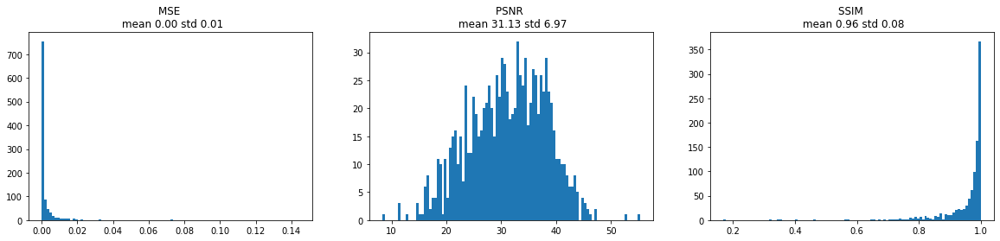

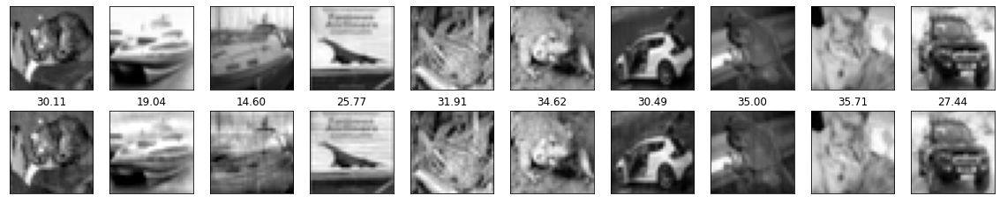

 28%|██▊       | 9/32 [00:00<00:00, 81.77it/s]

------------------------------- lr: 0.75--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.18it/s]


mse 0.00
psnr 34.49
ssim 0.96
mean mse 0.00
psnr of mean 27.56
psnr of mean (mean of psnr) 27.56(34.49)


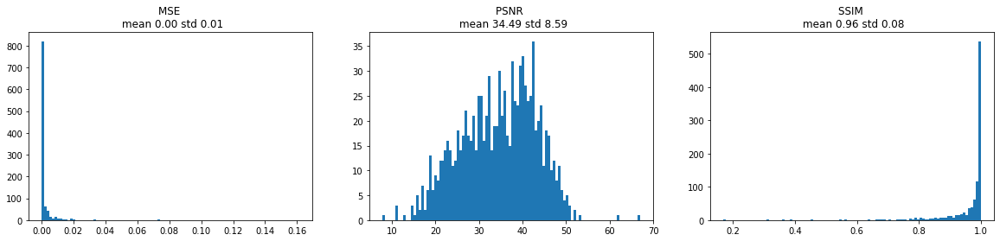

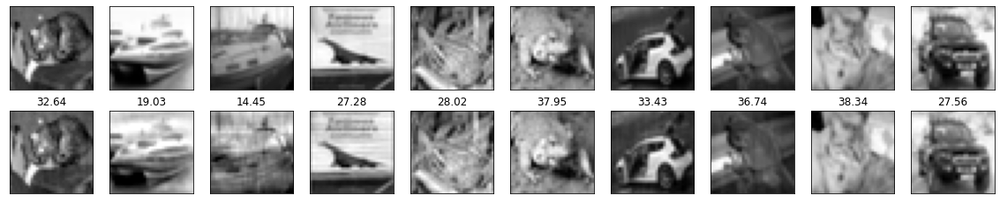

 28%|██▊       | 9/32 [00:00<00:00, 81.60it/s]

------------------------------- lr: 1--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.21it/s]


mse 0.00
psnr 37.04
ssim 0.97
mean mse 0.00
psnr of mean 27.92
psnr of mean (mean of psnr) 27.92(37.04)


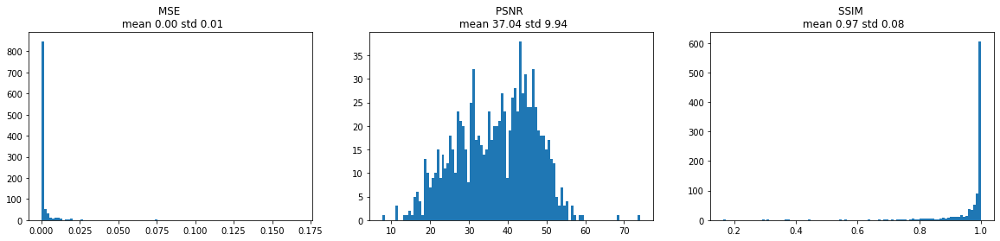

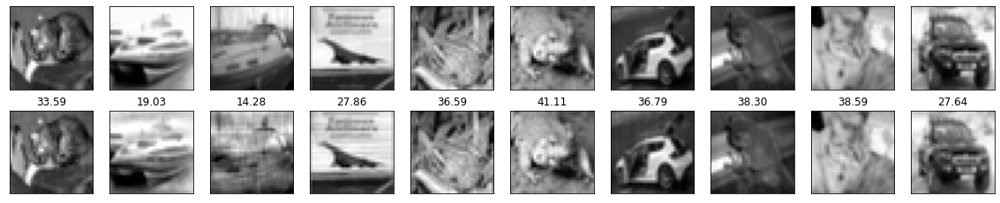

 28%|██▊       | 9/32 [00:00<00:00, 81.57it/s]

------------------------------- lr: 1.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.08it/s]


mse 0.00
psnr 38.84
ssim 0.97
mean mse 0.00
psnr of mean 28.03
psnr of mean (mean of psnr) 28.03(38.84)


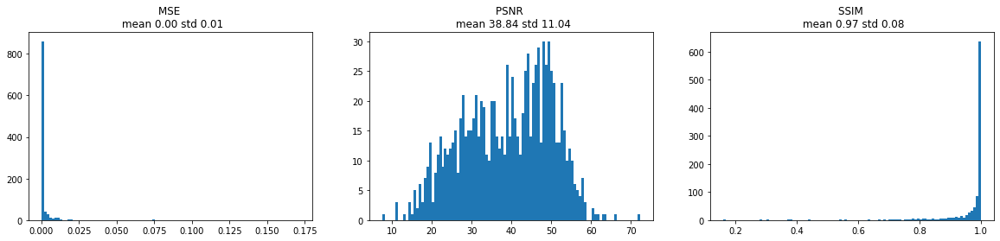

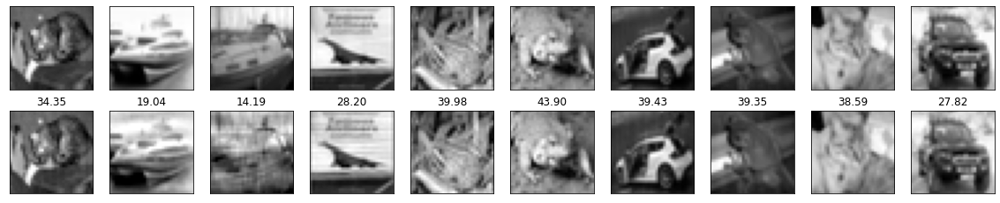

 28%|██▊       | 9/32 [00:00<00:00, 81.38it/s]

------------------------------- lr: 1.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 80.93it/s]


mse 0.00
psnr 40.44
ssim 0.97
mean mse 0.00
psnr of mean 28.28
psnr of mean (mean of psnr) 28.28(40.44)


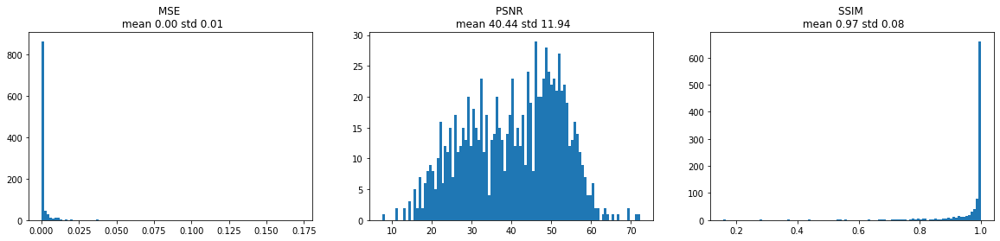

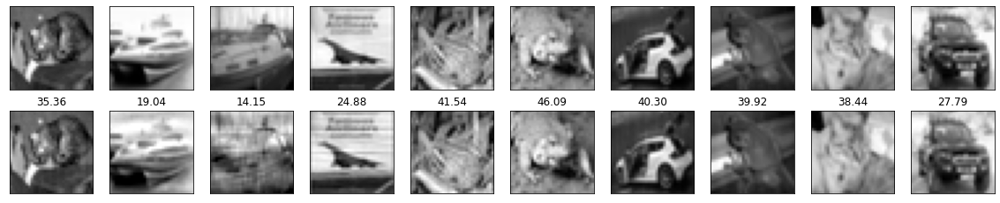

 28%|██▊       | 9/32 [00:00<00:00, 81.73it/s]

------------------------------- lr: 1.75--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.20it/s]


mse 0.00
psnr 41.95
ssim 0.97
mean mse 0.00
psnr of mean 28.63
psnr of mean (mean of psnr) 28.63(41.95)


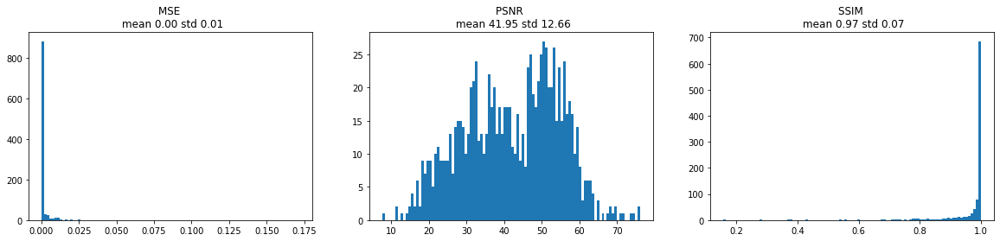

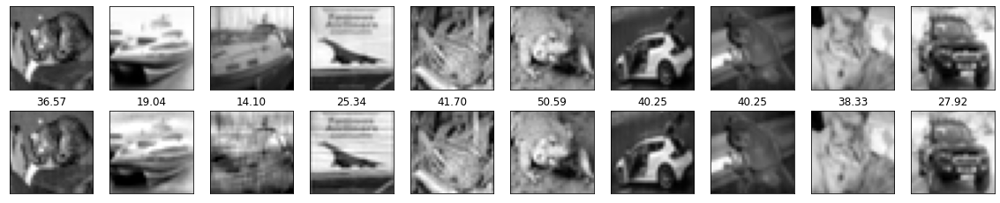

 28%|██▊       | 9/32 [00:00<00:00, 80.30it/s]

------------------------------- lr: 2--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 80.86it/s]


mse 0.02
psnr 23.74
ssim 0.84
mean mse 0.02
psnr of mean 16.73
psnr of mean (mean of psnr) 16.73(23.74)


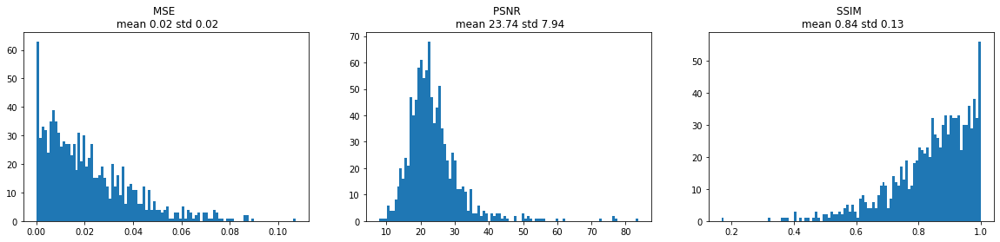

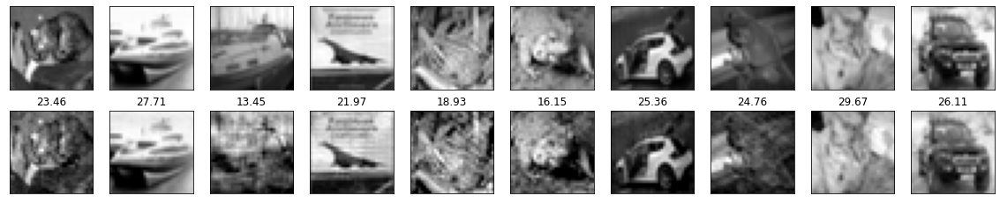

 28%|██▊       | 9/32 [00:00<00:00, 81.74it/s]

------------------------------- lr: 2.25--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 81.15it/s]


mse 0.15
psnr 9.69
ssim 0.26
mean mse 0.15
psnr of mean 8.29
psnr of mean (mean of psnr) 8.29(9.69)


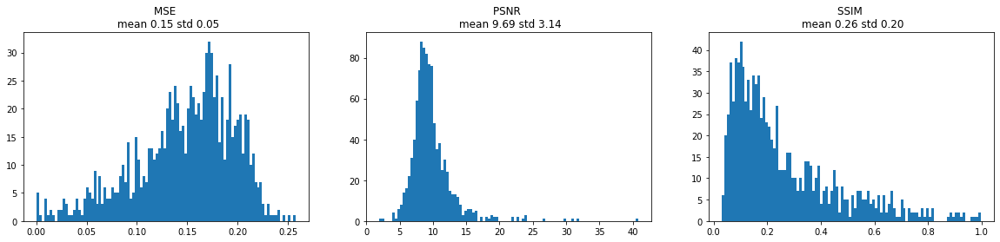

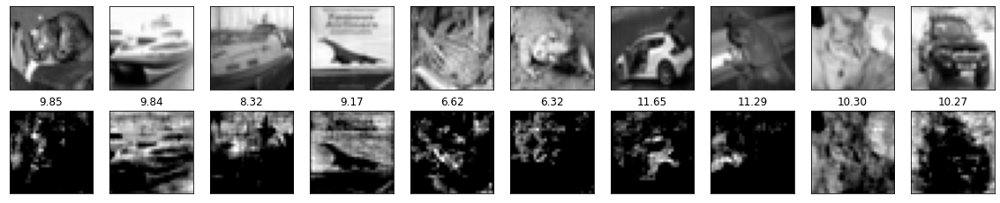

 28%|██▊       | 9/32 [00:00<00:00, 81.78it/s]

------------------------------- lr: 2.5--------------------------------------------


100%|██████████| 32/32 [00:00<00:00, 80.87it/s]


mse 0.20
psnr 7.51
ssim 0.12
mean mse 0.20
psnr of mean 7.01
psnr of mean (mean of psnr) 7.01(7.51)


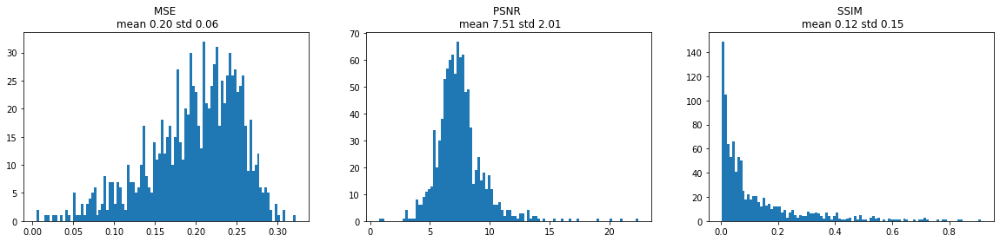

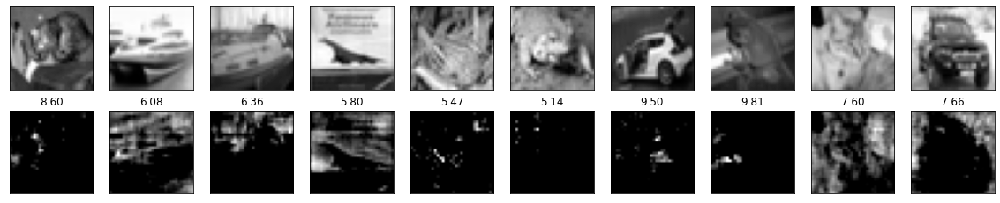

In [8]:
for lr in lrs:
    print(f'------------------------------- lr: {lr}--------------------------------------------')
    x_test_rec_cifar, mse_list_cifar, psnr_list_cifar, ssim_list_cifar = test_abs(n_test,
                                                                              n_batch,
                                                                              n_steps,
                                                                              lr,
                                                                              u_cifar,
                                                                              x_test_cifar)

    plot_test(x_test_rec_cifar,
          x_test_cifar,
          mse_list_cifar,
          psnr_list_cifar,
          ssim_list_cifar,
          n_test,
          plot_n = 10)

## CelebA

  0%|          | 0/32 [00:00<?, ?it/s]

------------------------------- lr: 0.25--------------------------------------------


100%|██████████| 32/32 [00:05<00:00,  5.74it/s]


mse 0.01
psnr 24.51
ssim 0.90
mean mse 0.01
psnr of mean 22.73
psnr of mean (mean of psnr) 22.73(24.51)


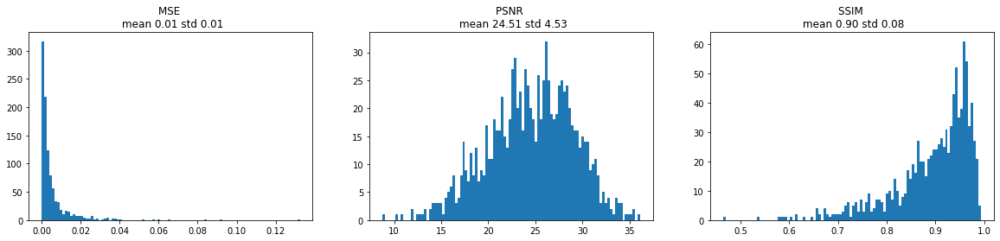

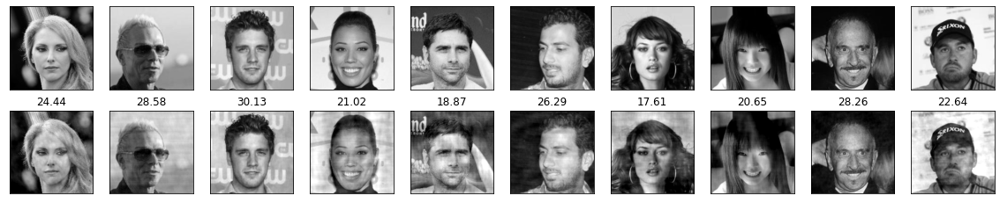

  0%|          | 0/32 [00:00<?, ?it/s]

------------------------------- lr: 0.5--------------------------------------------


100%|██████████| 32/32 [00:05<00:00,  5.73it/s]


mse 0.00
psnr 29.22
ssim 0.94
mean mse 0.00
psnr of mean 24.96
psnr of mean (mean of psnr) 24.96(29.22)


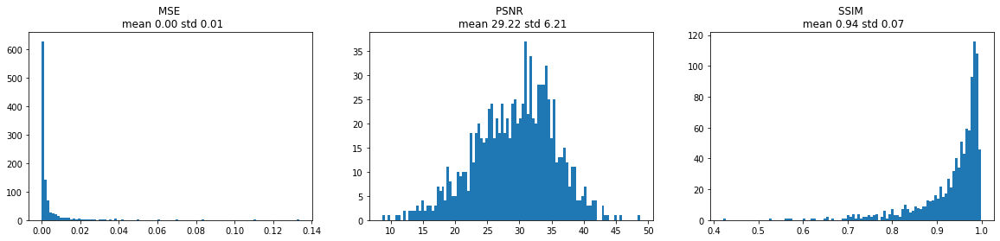

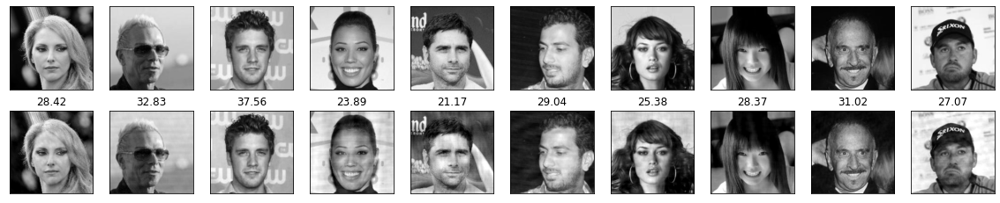

  0%|          | 0/32 [00:00<?, ?it/s]

------------------------------- lr: 0.75--------------------------------------------


100%|██████████| 32/32 [00:05<00:00,  5.74it/s]


mse 0.00
psnr 32.12
ssim 0.95
mean mse 0.00
psnr of mean 25.82
psnr of mean (mean of psnr) 25.82(32.12)


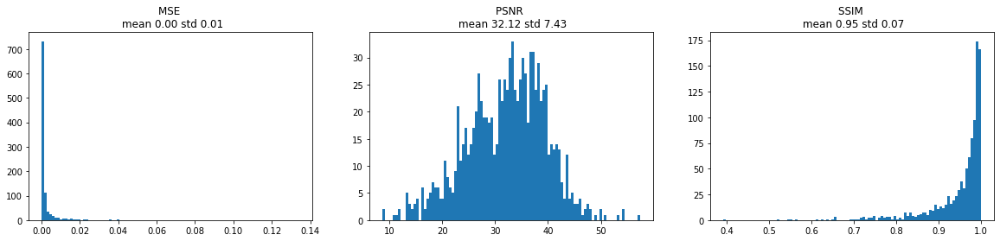

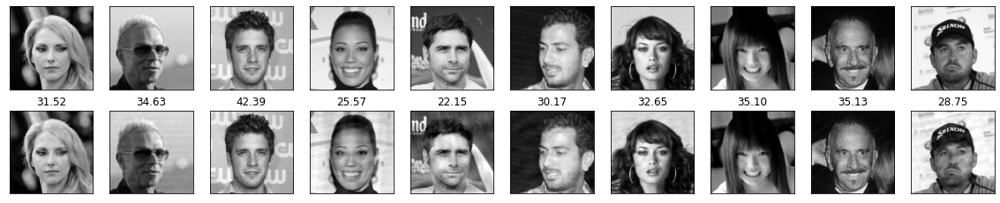

  0%|          | 0/32 [00:00<?, ?it/s]

------------------------------- lr: 1--------------------------------------------


100%|██████████| 32/32 [00:05<00:00,  5.74it/s]


mse 0.00
psnr 34.09
ssim 0.96
mean mse 0.00
psnr of mean 26.25
psnr of mean (mean of psnr) 26.25(34.09)


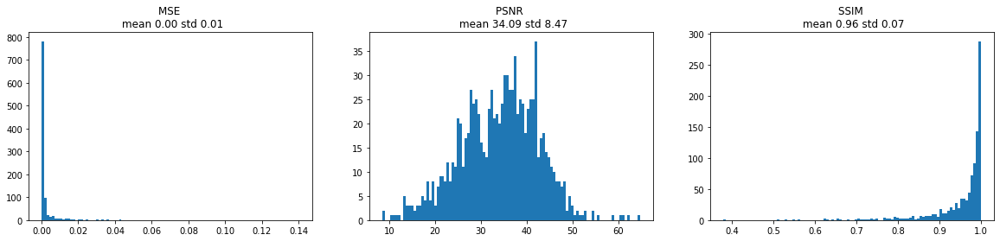

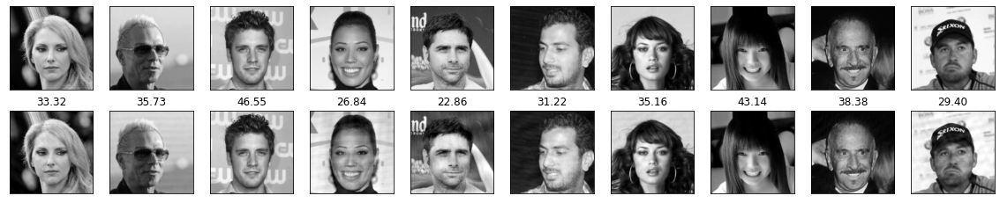

  0%|          | 0/32 [00:00<?, ?it/s]

------------------------------- lr: 1.25--------------------------------------------


100%|██████████| 32/32 [00:05<00:00,  5.74it/s]


mse 0.00
psnr 35.40
ssim 0.96
mean mse 0.00
psnr of mean 26.41
psnr of mean (mean of psnr) 26.41(35.40)


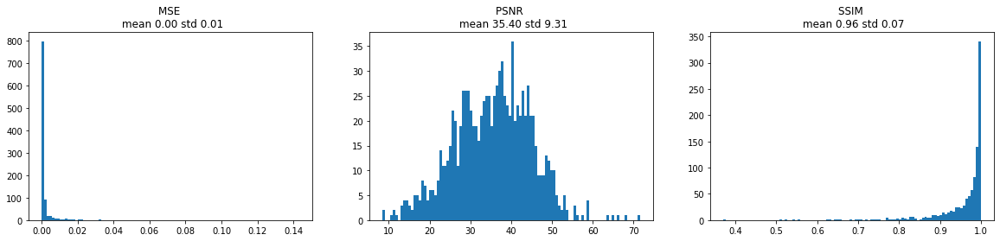

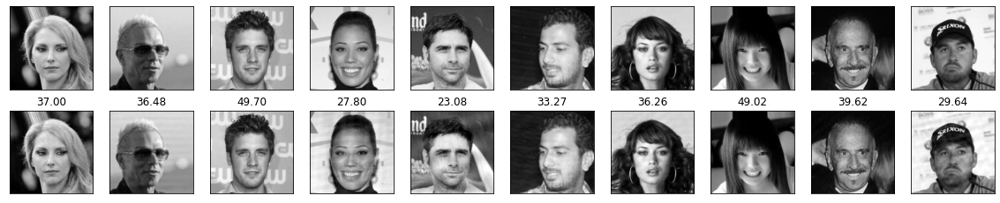

  0%|          | 0/32 [00:00<?, ?it/s]

------------------------------- lr: 1.5--------------------------------------------


100%|██████████| 32/32 [00:05<00:00,  5.74it/s]


mse 0.00
psnr 36.52
ssim 0.96
mean mse 0.00
psnr of mean 26.51
psnr of mean (mean of psnr) 26.51(36.52)


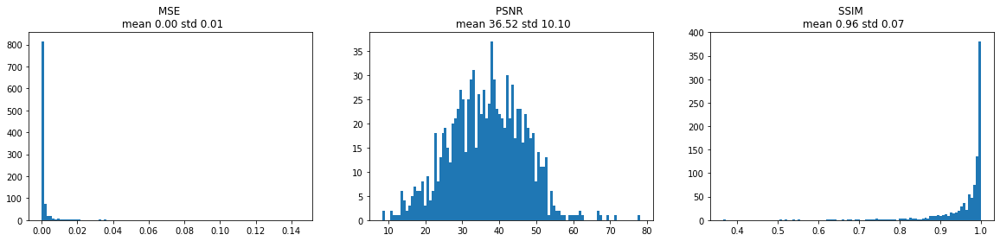

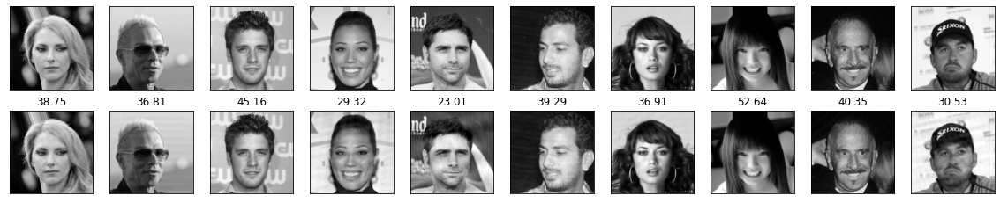

  0%|          | 0/32 [00:00<?, ?it/s]

------------------------------- lr: 1.75--------------------------------------------


100%|██████████| 32/32 [00:05<00:00,  5.73it/s]


mse 0.00
psnr 37.89
ssim 0.96
mean mse 0.00
psnr of mean 26.83
psnr of mean (mean of psnr) 26.83(37.89)


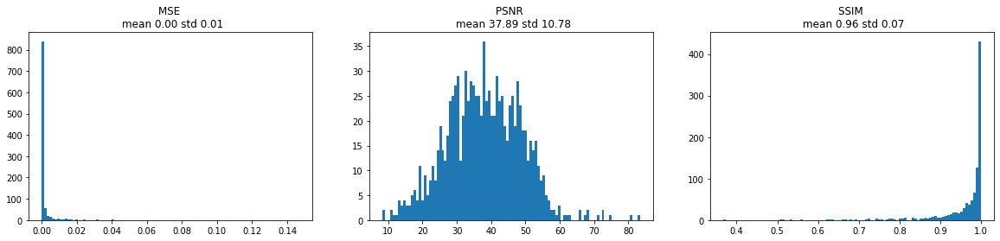

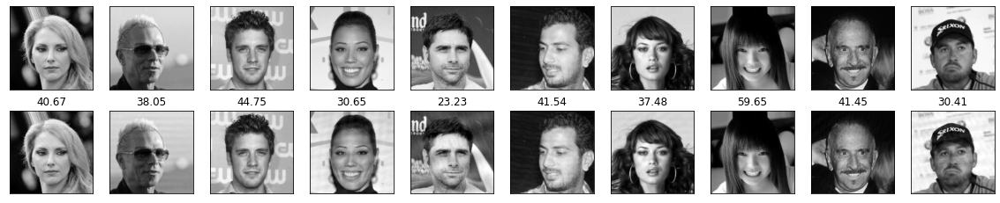

  0%|          | 0/32 [00:00<?, ?it/s]

------------------------------- lr: 2--------------------------------------------


100%|██████████| 32/32 [00:05<00:00,  5.74it/s]


mse 0.01
psnr 26.43
ssim 0.87
mean mse 0.01
psnr of mean 19.30
psnr of mean (mean of psnr) 19.30(26.43)


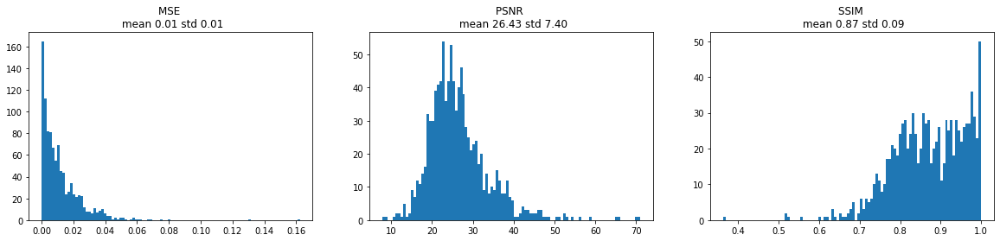

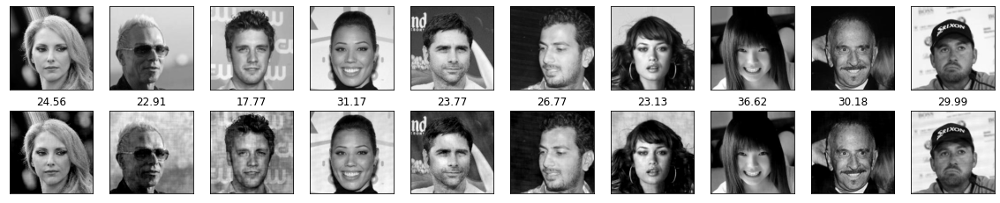

  0%|          | 0/32 [00:00<?, ?it/s]

------------------------------- lr: 2.25--------------------------------------------


100%|██████████| 32/32 [00:05<00:00,  5.74it/s]


mse 0.12
psnr 10.09
ssim 0.29
mean mse 0.12
psnr of mean 9.21
psnr of mean (mean of psnr) 9.21(10.09)


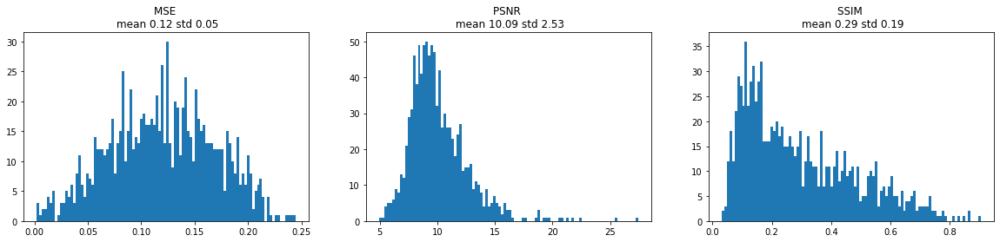

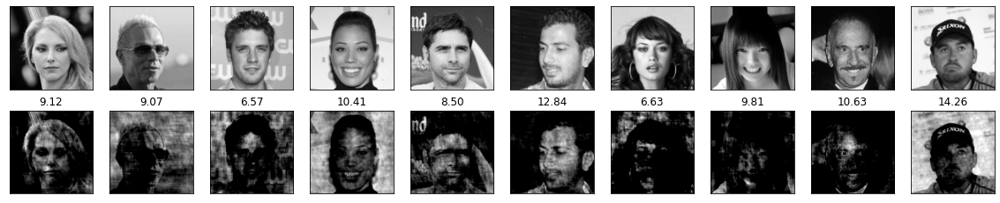

  0%|          | 0/32 [00:00<?, ?it/s]

------------------------------- lr: 2.5--------------------------------------------


100%|██████████| 32/32 [00:05<00:00,  5.74it/s]


mse 0.18
psnr 7.66
ssim 0.15
mean mse 0.18
psnr of mean 7.49
psnr of mean (mean of psnr) 7.49(7.66)


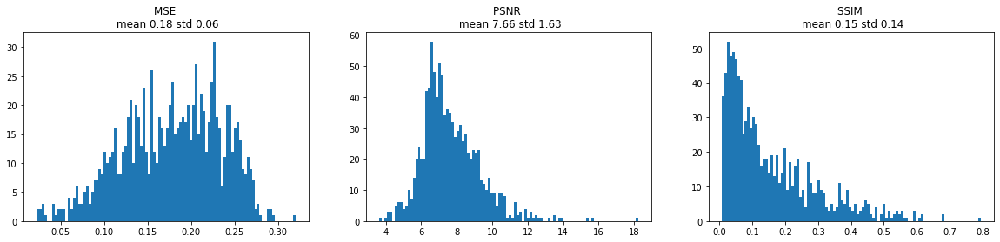

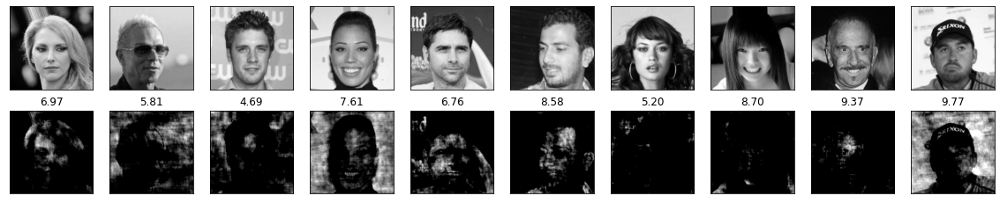

In [9]:
for lr in lrs:
    print(f'------------------------------- lr: {lr}--------------------------------------------')
    x_test_rec_celeb, mse_list_celeb, psnr_list_celeb, ssim_list_celeb = test_abs(n_test,
                                                                              n_batch,
                                                                              n_steps,
                                                                              lr,
                                                                              u_celeb,
                                                                              x_test_celeb)

    plot_test(x_test_rec_celeb,
          x_test_celeb,
          mse_list_celeb,
          psnr_list_celeb,
          ssim_list_celeb,
          n_test,
          plot_n = 10)

# 2. Variable learning rate alpha in training

Note that because of the over and underfitting the best reference u can appear in every epoch and hence we have to select the best reference u manually after we trained it. While this is clearly not the most efficient way to perform this experiemnts, we prefered it over refactoring the codebase for training. In the follwoing we present the code we looped through for each dataset.

In [10]:
# reset the parameters for sanity
n_steps = 50
n_epoch = 5
n_train = 32
n_batch = 32
lr_u = 1
U_range = [0,1]
n_test = 1000

## The training/evaluation loop

0
best so far 1


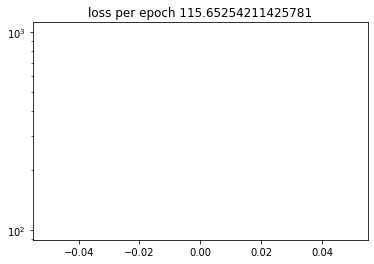

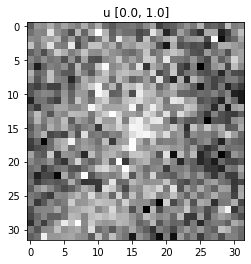

psnr 9.471447467803955
mse 0.1129419356584549


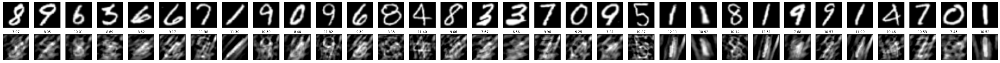

1
best so far 2


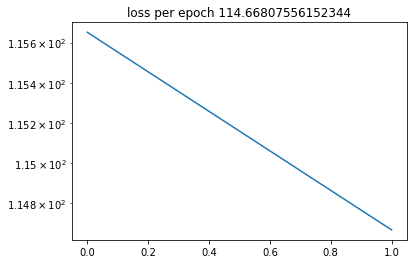

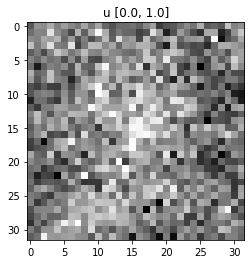

psnr 9.50857400894165
mse 0.11198054254055023


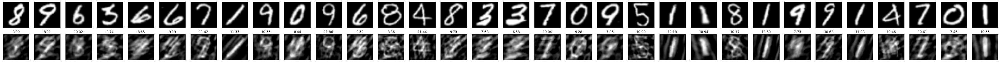

2
best so far 3


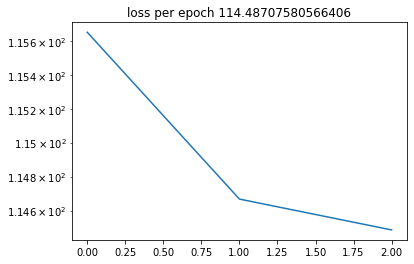

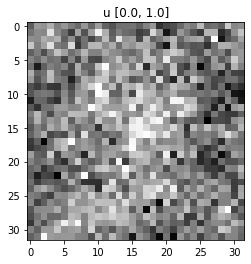

psnr 9.515435099601746
mse 0.11180378496646881


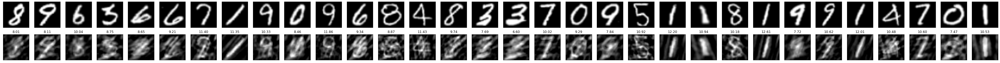

3
best so far 4


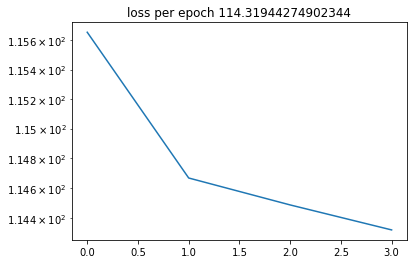

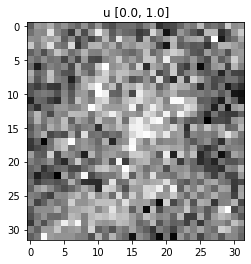

psnr 9.521799087524414
mse 0.1116400733590126


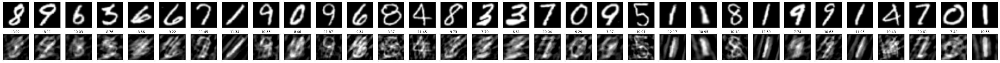

4
best so far 5


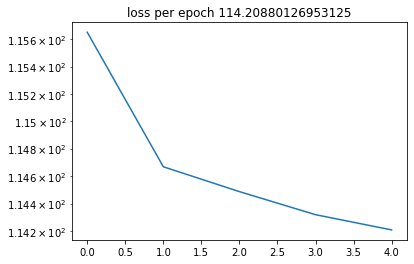

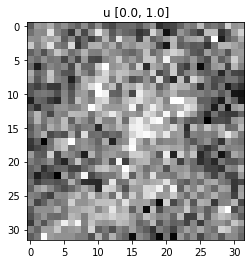

psnr 9.52600359916687
mse 0.11153203248977661


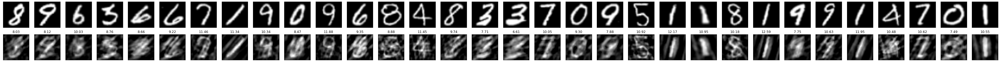

best_epoch 5


In [11]:
# set learning rate for training
alpha = 0.001

# train on dataset with learning rate
train_abs(n_epoch,n_train,n_batch,alpha,lr_u,n_steps,U_range,'mnist',x_train_mnist)

100%|██████████| 32/32 [00:00<00:00, 80.68it/s]


mse 0.02
psnr 28.52
ssim 0.82
mean mse 0.02
psnr of mean 17.91
psnr of mean (mean of psnr) 17.91(28.52)


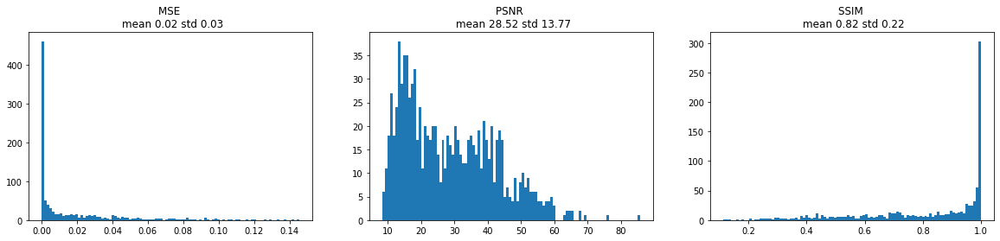

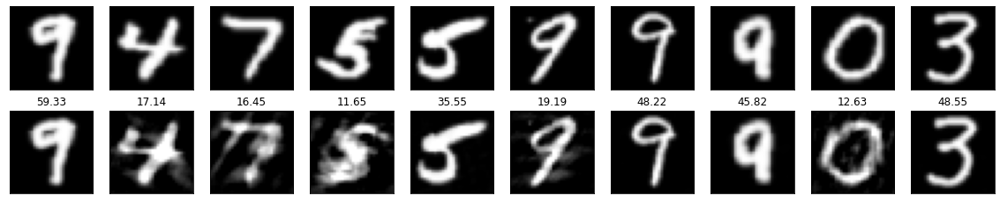

In [12]:
#load best reference

# if the best reference is the last epoch use this code to load the reference
path = f'./output_abs/20200202_mnist_{n_epoch}_{n_train//n_batch}_{n_batch}_{alpha}_{lr_u}_{n_steps}_{U_range}/u_mnist_32.npy'
u = np.load(path)

# if the best reference is not the last epoch, set the best epoch and load the reference with 
# this code.

# best_epoch = 3
# path = f'./output_abs/20200202_mnist_{n_epoch}_{n_train//n_batch}_{n_batch}_{alpha}_{lr_u}_{n_steps}_{U_range}/u_{best_epoch}.npy'
# u= np.load(path)
# u = u[0]

# evaluate on testset (N = 1000)
# set alpha in recovery
alpha = 1

# execute retrieval
x_test_rec_mnist, mse_list_mnist, psnr_list_mnist, ssim_list_mnist = test_abs(n_test,
                                                                              n_batch,
                                                                              n_steps,
                                                                              alpha,
                                                                              u,
                                                                              x_test_mnist)

plot_test(x_test_rec_mnist,
          x_test_mnist,
          mse_list_mnist,
          psnr_list_mnist,
          ssim_list_mnist,
          n_test,
          plot_n = 10)

# 3. Variable learning rate lr_u in training

Again, for the same reason we loop through the both code cells to obtain our results for the study.

In [13]:
# reset parameters for sanity
n_steps = 50
n_epoch = 5
n_train = 32
n_batch = 32
alpha = 1
U_range = [0,1]
n_test = 1000

## The training/evaluation loop

0
best so far 1


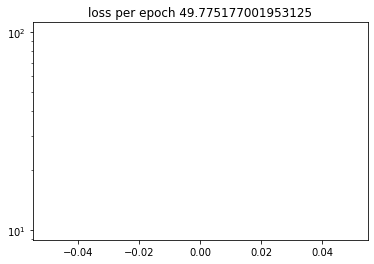

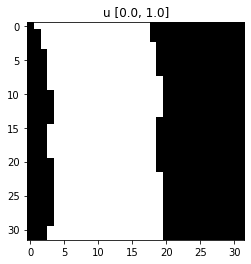

psnr 13.132003545761108
mse 0.04860857129096985


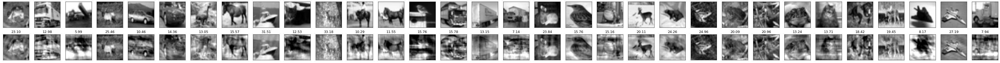

1
best so far 2


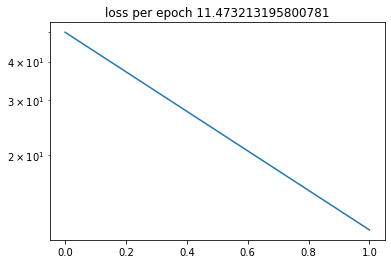

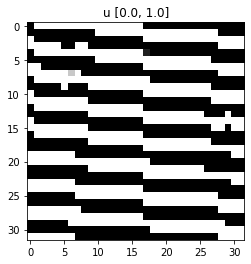

psnr 19.505280256271362
mse 0.0112043097615242


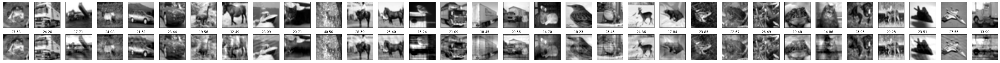

2
best so far 2


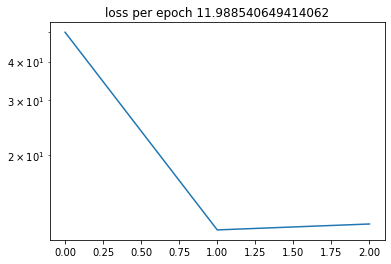

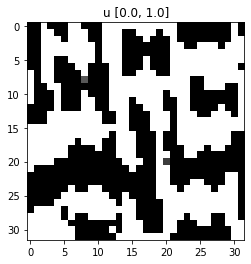

psnr 19.314467906951904
mse 0.01170755922794342


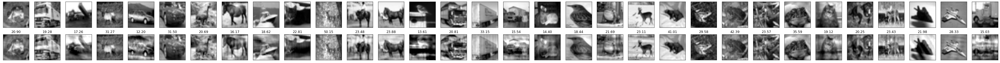

3
best so far 4


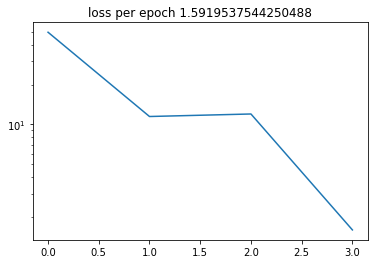

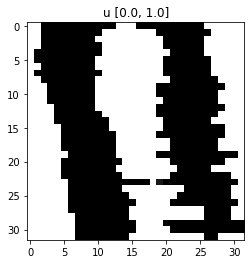

psnr 28.082826137542725
mse 0.0015546424547210336


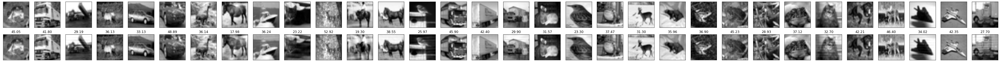

4
best so far 4


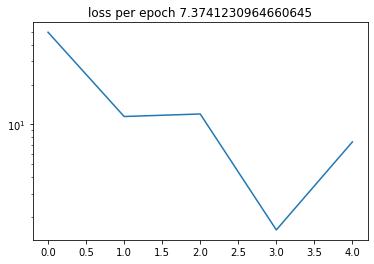

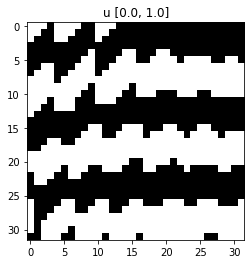

psnr 21.42502784729004
mse 0.007201292552053928


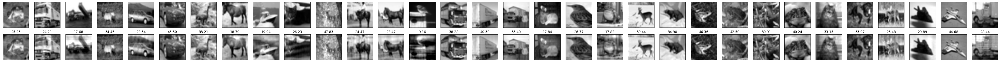

best_epoch 4


In [14]:
# set the learning rate beta 
lr_u = 1000

# train on dataset with learning rate
train_abs(n_epoch,n_train,n_batch,alpha,lr_u,n_steps,U_range,'cifar',x_train_cifar)

100%|██████████| 32/32 [00:00<00:00, 80.21it/s]


mse 0.01
psnr 27.59
ssim 0.90
mean mse 0.01
psnr of mean 21.56
psnr of mean (mean of psnr) 21.56(27.59)


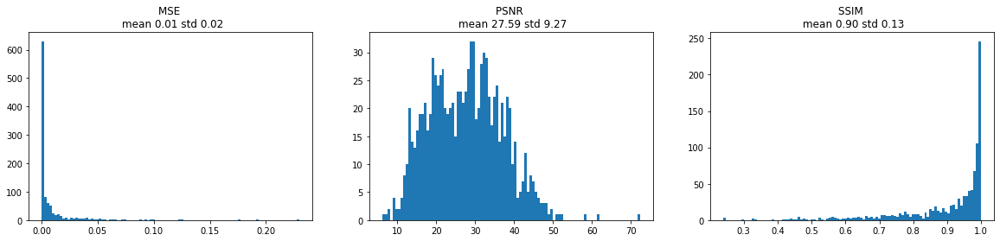

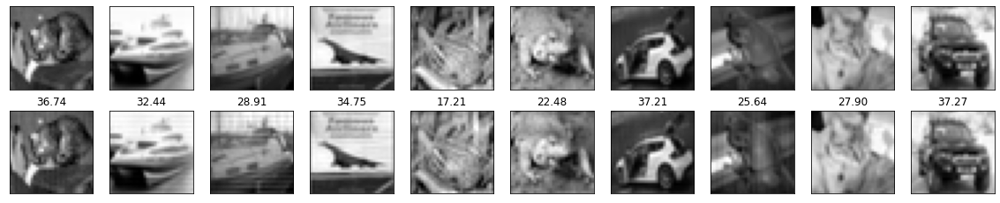

In [15]:
#load best reference

# if the best reference is the last epoch use this code to load the reference
# path = f'./output_abs/20200202_cifar_{n_epoch}_{n_train//n_batch}_{n_batch}_{alpha}_{lr_u}_{n_steps}_{U_range}/u_cifar_32.npy'
# u = np.load(path)

# if the best reference is not the last epoch, set the best epoch and load the reference with 
# this code.
best_epoch = 4
path = f'./output_abs/20200202_cifar_{n_epoch}_{n_train//n_batch}_{n_batch}_{alpha}_{lr_u}_{n_steps}_{U_range}/u_{best_epoch}.npy'
u = np.load(path)
u = u[0]

# evaluate on testset (N = 1000)

# set alpha in recovery
alpha = 1


# execute retrieval
x_test_rec_cifar, mse_list_cifar, psnr_list_cifar, ssim_list_cifar = test_abs(n_test,
                                                                              n_batch,
                                                                              n_steps,
                                                                              alpha,
                                                                              u,
                                                                              x_test_cifar)

plot_test(x_test_rec_cifar,
          x_test_cifar,
          mse_list_cifar,
          psnr_list_cifar,
          ssim_list_cifar,
          n_test,
          plot_n = 10)